# Nutrition Paradox: A global view on obesity and malnutrition
### With request, pandas, numpy, matplotlib, seaborn, MySQL and PowerBI
By Vikramselvaganesh


In [1]:
# Installation and Import of the required package for the project. 
import requests
import pandas as pd
!pip install pycountry
import pycountry
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Step_1: Dataset Overview and Collection
Obesity and Malnutrition among adults and children

### 1.1 Get Data for obesity and malnutrition
Getting data and age_group

#### Get Data for obesity adult

In [2]:
# url_oa to store the url for the requests. 
# The variable can be any name as be the python rules. 
# The 'o' for obesity and 'a' for adults is used to give a meaning full name for the variable.

url_oa = 'https://ghoapi.azureedge.net/api/NCD_BMI_30C'

response = requests.get(url_oa)
#data_oa store the json file. 
data_oa = response.json()

In [3]:
#Checking the data structure. 
data_oa

{'@odata.context': 'https://ghoapi.azureedge.net/api/$metadata#NCD_BMI_30C',
 'value': [{'Id': 5395519,
   'IndicatorCode': 'NCD_BMI_30C',
   'SpatialDimType': 'COUNTRY',
   'SpatialDim': 'SAU',
   'ParentLocationCode': 'EMR',
   'TimeDimType': 'YEAR',
   'ParentLocation': 'Eastern Mediterranean',
   'Dim1Type': 'SEX',
   'TimeDim': 1997,
   'Dim1': 'SEX_BTSX',
   'Dim2Type': 'AGEGROUP',
   'Dim2': 'AGEGROUP_YEARS18-PLUS',
   'Dim3Type': None,
   'Dim3': None,
   'DataSourceDimType': None,
   'DataSourceDim': None,
   'Value': '22.1 [21.1-23.2]',
   'NumericValue': 22.111502,
   'Low': 21.063206,
   'High': 23.219305,
   'Comments': None,
   'Date': '2024-02-29T16:06:41.017+01:00',
   'TimeDimensionValue': '1997',
   'TimeDimensionBegin': '1997-01-01T00:00:00+01:00',
   'TimeDimensionEnd': '1997-12-31T00:00:00+01:00'},
  {'Id': 5395636,
   'IndicatorCode': 'NCD_BMI_30C',
   'SpatialDimType': 'COUNTRY',
   'SpatialDim': 'LKA',
   'ParentLocationCode': 'SEAR',
   'TimeDimType': 'YEAR',
 

In [4]:
# Checking the available key 
# Because for the data structure. the observation made that it's a dict with list
data_oa.keys()

dict_keys(['@odata.context', 'value'])

In [5]:
# Conver into the data format
df_oa = pd.DataFrame(data_oa['value'])

In [6]:
df_oa.head()

,Id,IndicatorCode,SpatialDimType,SpatialDim,ParentLocationCode,TimeDimType,ParentLocation,Dim1Type,TimeDim,Dim1,...,DataSourceDim,Value,NumericValue,Low,High,Comments,Date,TimeDimensionValue,TimeDimensionBegin,TimeDimensionEnd
0,5395519,NCD_BMI_30C,COUNTRY,SAU,EMR,YEAR,Eastern Mediterranean,SEX,1997,SEX_BTSX,...,None,22.1 [21.1-23.2],22.111502,21.063206,23.219305,None,2024-02-29T16:06:41.017+01:00,1997,1997-01-01T00:00:00+01:00,1997-12-31T00:00:00+01:00
1,5395636,NCD_BMI_30C,COUNTRY,LKA,SEAR,YEAR,South-East Asia,SEX,2013,SEX_MLE,...,None,3.7 [3.0-4.4],3.682037,3.004463,4.399506,None,2024-02-29T16:06:41.017+01:00,2013,2013-01-01T00:00:00+01:00,2013-12-31T00:00:00+01:00
2,5395898,NCD_BMI_30C,COUNTRY,KAZ,EUR,YEAR,Europe,SEX,2005,SEX_FMLE,...,None,19.0 [16.9-21.3],19.026031,16.881686,21.300718,None,2024-02-29T16:06:41.017+01:00,2005,2005-01-01T00:00:00+01:00,2005-12-31T00:00:00+01:00
3,261,NCD_BMI_30C,COUNTRY,KHM,WPR,YEAR,Western Pacific,SEX,2001,SEX_BTSX,...,None,1.0 [0.8-1.3],0.981696,0.756741,1.274868,None,2024-02-29T16:06:41.017+01:00,2001,2001-01-01T00:00:00+01:00,2001-12-31T00:00:00+01:00
4,358,NCD_BMI_30C,COUNTRY,IRN,EMR,YEAR,Eastern Mediterranean,SEX,2020,SEX_MLE,...,None,17.5 [15.8-19.2],17.487641,15.793777,19.245727,None,2024-02-29T16:06:41.017+01:00,2020,2020-01-01T00:00:00+01:00,2020-12-31T00:00:00+01:00


In [7]:
# the age_group column is added to find. The data is collected from the adult or children
# it will be heplful, while we combine the adult and childrean data. 
df_oa['age_group'] = 'adults'

In [8]:
# Check for the age_group column. 
df_oa.head()

,Id,IndicatorCode,SpatialDimType,SpatialDim,ParentLocationCode,TimeDimType,ParentLocation,Dim1Type,TimeDim,Dim1,...,Value,NumericValue,Low,High,Comments,Date,TimeDimensionValue,TimeDimensionBegin,TimeDimensionEnd,age_group
0,5395519,NCD_BMI_30C,COUNTRY,SAU,EMR,YEAR,Eastern Mediterranean,SEX,1997,SEX_BTSX,...,22.1 [21.1-23.2],22.111502,21.063206,23.219305,None,2024-02-29T16:06:41.017+01:00,1997,1997-01-01T00:00:00+01:00,1997-12-31T00:00:00+01:00,adults
1,5395636,NCD_BMI_30C,COUNTRY,LKA,SEAR,YEAR,South-East Asia,SEX,2013,SEX_MLE,...,3.7 [3.0-4.4],3.682037,3.004463,4.399506,None,2024-02-29T16:06:41.017+01:00,2013,2013-01-01T00:00:00+01:00,2013-12-31T00:00:00+01:00,adults
2,5395898,NCD_BMI_30C,COUNTRY,KAZ,EUR,YEAR,Europe,SEX,2005,SEX_FMLE,...,19.0 [16.9-21.3],19.026031,16.881686,21.300718,None,2024-02-29T16:06:41.017+01:00,2005,2005-01-01T00:00:00+01:00,2005-12-31T00:00:00+01:00,adults
3,261,NCD_BMI_30C,COUNTRY,KHM,WPR,YEAR,Western Pacific,SEX,2001,SEX_BTSX,...,1.0 [0.8-1.3],0.981696,0.756741,1.274868,None,2024-02-29T16:06:41.017+01:00,2001,2001-01-01T00:00:00+01:00,2001-12-31T00:00:00+01:00,adults
4,358,NCD_BMI_30C,COUNTRY,IRN,EMR,YEAR,Eastern Mediterranean,SEX,2020,SEX_MLE,...,17.5 [15.8-19.2],17.487641,15.793777,19.245727,None,2024-02-29T16:06:41.017+01:00,2020,2020-01-01T00:00:00+01:00,2020-12-31T00:00:00+01:00,adults


#### Get Data for obesity Children

In [9]:
url_oc = 'https://ghoapi.azureedge.net/api/NCD_BMI_PLUS2C'

response = requests.get(url_oc)

data_oc = response.json()

In [10]:
#Checking the data structure. 
data_oc

{'@odata.context': 'https://ghoapi.azureedge.net/api/$metadata#NCD_BMI_PLUS2C',
 'value': [{'Id': 5395477,
   'IndicatorCode': 'NCD_BMI_PLUS2C',
   'SpatialDimType': 'COUNTRY',
   'SpatialDim': 'PAN',
   'ParentLocationCode': 'AMR',
   'TimeDimType': 'YEAR',
   'ParentLocation': 'Americas',
   'Dim1Type': 'SEX',
   'TimeDim': 2014,
   'Dim1': 'SEX_FMLE',
   'Dim2Type': 'AGEGROUP',
   'Dim2': 'AGEGROUP_YEARS10-19',
   'Dim3Type': None,
   'Dim3': None,
   'DataSourceDimType': None,
   'DataSourceDim': None,
   'Value': '10.7 [8.3-13.3]',
   'NumericValue': 10.686975,
   'Low': 8.3174512,
   'High': 13.345407,
   'Comments': None,
   'Date': '2024-02-29T16:06:41.017+01:00',
   'TimeDimensionValue': '2014',
   'TimeDimensionBegin': '2014-01-01T00:00:00+01:00',
   'TimeDimensionEnd': '2014-12-31T00:00:00+01:00'},
  {'Id': 5395540,
   'IndicatorCode': 'NCD_BMI_PLUS2C',
   'SpatialDimType': 'REGION',
   'SpatialDim': 'EMR',
   'ParentLocationCode': None,
   'TimeDimType': 'YEAR',
   'ParentL

In [11]:
data_oc.keys()

dict_keys(['@odata.context', 'value'])

In [12]:
# Conver into the data format
df_oc = pd.DataFrame(data_oc['value'])

In [13]:
df_oc.head()

,Id,IndicatorCode,SpatialDimType,SpatialDim,ParentLocationCode,TimeDimType,ParentLocation,Dim1Type,TimeDim,Dim1,...,DataSourceDim,Value,NumericValue,Low,High,Comments,Date,TimeDimensionValue,TimeDimensionBegin,TimeDimensionEnd
0,5395477,NCD_BMI_PLUS2C,COUNTRY,PAN,AMR,YEAR,Americas,SEX,2014,SEX_FMLE,...,None,10.7 [8.3-13.3],10.686975,8.317451,13.345407,None,2024-02-29T16:06:41.017+01:00,2014,2014-01-01T00:00:00+01:00,2014-12-31T00:00:00+01:00
1,5395540,NCD_BMI_PLUS2C,REGION,EMR,None,YEAR,None,SEX,2003,SEX_MLE,...,None,5.1 [4.4-6.0],5.141227,4.420246,5.991681,None,2024-05-23T13:28:38.2+02:00,2003,2003-01-01T00:00:00+01:00,2003-12-31T00:00:00+01:00
2,5395656,NCD_BMI_PLUS2C,COUNTRY,BHR,EMR,YEAR,Eastern Mediterranean,SEX,1998,SEX_BTSX,...,None,7.9 [5.3-11.0],7.935947,5.342249,11.013664,None,2024-02-29T16:06:41.017+01:00,1998,1998-01-01T00:00:00+01:00,1998-12-31T00:00:00+01:00
3,5395866,NCD_BMI_PLUS2C,COUNTRY,TCD,AFR,YEAR,Africa,SEX,1992,SEX_BTSX,...,None,0.4 [0.1-1.1],0.389522,0.080600,1.131119,None,2024-02-29T16:06:41.017+01:00,1992,1992-01-01T00:00:00+01:00,1992-12-31T00:00:00+01:00
4,5395969,NCD_BMI_PLUS2C,COUNTRY,SLE,AFR,YEAR,Africa,SEX,1990,SEX_FMLE,...,None,1.2 [0.2-3.2],1.170299,0.230759,3.230768,None,2024-02-29T16:06:41.017+01:00,1990,1990-01-01T00:00:00+01:00,1990-12-31T00:00:00+01:00


In [14]:
df_oc['age_group'] = 'childern'

In [15]:
df_oc.head()

,Id,IndicatorCode,SpatialDimType,SpatialDim,ParentLocationCode,TimeDimType,ParentLocation,Dim1Type,TimeDim,Dim1,...,Value,NumericValue,Low,High,Comments,Date,TimeDimensionValue,TimeDimensionBegin,TimeDimensionEnd,age_group
0,5395477,NCD_BMI_PLUS2C,COUNTRY,PAN,AMR,YEAR,Americas,SEX,2014,SEX_FMLE,...,10.7 [8.3-13.3],10.686975,8.317451,13.345407,None,2024-02-29T16:06:41.017+01:00,2014,2014-01-01T00:00:00+01:00,2014-12-31T00:00:00+01:00,childern
1,5395540,NCD_BMI_PLUS2C,REGION,EMR,None,YEAR,None,SEX,2003,SEX_MLE,...,5.1 [4.4-6.0],5.141227,4.420246,5.991681,None,2024-05-23T13:28:38.2+02:00,2003,2003-01-01T00:00:00+01:00,2003-12-31T00:00:00+01:00,childern
2,5395656,NCD_BMI_PLUS2C,COUNTRY,BHR,EMR,YEAR,Eastern Mediterranean,SEX,1998,SEX_BTSX,...,7.9 [5.3-11.0],7.935947,5.342249,11.013664,None,2024-02-29T16:06:41.017+01:00,1998,1998-01-01T00:00:00+01:00,1998-12-31T00:00:00+01:00,childern
3,5395866,NCD_BMI_PLUS2C,COUNTRY,TCD,AFR,YEAR,Africa,SEX,1992,SEX_BTSX,...,0.4 [0.1-1.1],0.389522,0.080600,1.131119,None,2024-02-29T16:06:41.017+01:00,1992,1992-01-01T00:00:00+01:00,1992-12-31T00:00:00+01:00,childern
4,5395969,NCD_BMI_PLUS2C,COUNTRY,SLE,AFR,YEAR,Africa,SEX,1990,SEX_FMLE,...,1.2 [0.2-3.2],1.170299,0.230759,3.230768,None,2024-02-29T16:06:41.017+01:00,1990,1990-01-01T00:00:00+01:00,1990-12-31T00:00:00+01:00,childern


#### Get Data for malnutrition adult

In [16]:
url_ma = 'https://ghoapi.azureedge.net/api/NCD_BMI_18C'

response = requests.get(url_ma)

data_ma = response.json()

In [17]:
#Checking the data structure. 
data_ma

{'@odata.context': 'https://ghoapi.azureedge.net/api/$metadata#NCD_BMI_18C',
 'value': [{'Id': 53,
   'IndicatorCode': 'NCD_BMI_18C',
   'SpatialDimType': 'COUNTRY',
   'SpatialDim': 'GAB',
   'ParentLocationCode': 'AFR',
   'TimeDimType': 'YEAR',
   'ParentLocation': 'Africa',
   'Dim1Type': 'SEX',
   'TimeDim': 2021,
   'Dim1': 'SEX_FMLE',
   'Dim2Type': 'AGEGROUP',
   'Dim2': 'AGEGROUP_YEARS18-PLUS',
   'Dim3Type': None,
   'Dim3': None,
   'DataSourceDimType': None,
   'DataSourceDim': None,
   'Value': '5.8 [4.0-8.1]',
   'NumericValue': 5.7951104,
   'Low': 3.9720364,
   'High': 8.0770209,
   'Comments': None,
   'Date': '2024-02-29T16:06:41.017+01:00',
   'TimeDimensionValue': '2021',
   'TimeDimensionBegin': '2021-01-01T00:00:00+01:00',
   'TimeDimensionEnd': '2021-12-31T00:00:00+01:00'},
  {'Id': 415,
   'IndicatorCode': 'NCD_BMI_18C',
   'SpatialDimType': 'COUNTRY',
   'SpatialDim': 'TUV',
   'ParentLocationCode': 'WPR',
   'TimeDimType': 'YEAR',
   'ParentLocation': 'Western

In [18]:
data_ma.keys()

dict_keys(['@odata.context', 'value'])

In [19]:
# Conver into the data format
df_ma = pd.DataFrame(data_ma['value'])

In [20]:
df_ma.head()

,Id,IndicatorCode,SpatialDimType,SpatialDim,ParentLocationCode,TimeDimType,ParentLocation,Dim1Type,TimeDim,Dim1,...,DataSourceDim,Value,NumericValue,Low,High,Comments,Date,TimeDimensionValue,TimeDimensionBegin,TimeDimensionEnd
0,53,NCD_BMI_18C,COUNTRY,GAB,AFR,YEAR,Africa,SEX,2021,SEX_FMLE,...,None,5.8 [4.0-8.1],5.795110,3.972036,8.077021,None,2024-02-29T16:06:41.017+01:00,2021,2021-01-01T00:00:00+01:00,2021-12-31T00:00:00+01:00
1,415,NCD_BMI_18C,COUNTRY,TUV,WPR,YEAR,Western Pacific,SEX,2001,SEX_BTSX,...,None,0.9 [0.4-1.9],0.936569,0.365154,1.859289,None,2024-02-29T16:06:41.017+01:00,2001,2001-01-01T00:00:00+01:00,2001-12-31T00:00:00+01:00
2,1667,NCD_BMI_18C,COUNTRY,GHA,AFR,YEAR,Africa,SEX,2002,SEX_MLE,...,None,13.2 [10.0-16.7],13.204283,10.048541,16.712034,None,2024-02-29T16:06:41.017+01:00,2002,2002-01-01T00:00:00+01:00,2002-12-31T00:00:00+01:00
3,2048,NCD_BMI_18C,COUNTRY,TCD,AFR,YEAR,Africa,SEX,1990,SEX_BTSX,...,None,23.2 [17.8-29.0],23.201345,17.808078,28.990203,None,2024-02-29T16:06:41.017+01:00,1990,1990-01-01T00:00:00+01:00,1990-12-31T00:00:00+01:00
4,2246,NCD_BMI_18C,COUNTRY,MNG,WPR,YEAR,Western Pacific,SEX,2017,SEX_BTSX,...,None,3.1 [2.4-3.8],3.090652,2.428230,3.842155,None,2024-02-29T16:06:41.017+01:00,2017,2017-01-01T00:00:00+01:00,2017-12-31T00:00:00+01:00


In [21]:
df_ma['age_group'] = 'adults'

In [22]:
df_ma.head()

,Id,IndicatorCode,SpatialDimType,SpatialDim,ParentLocationCode,TimeDimType,ParentLocation,Dim1Type,TimeDim,Dim1,...,Value,NumericValue,Low,High,Comments,Date,TimeDimensionValue,TimeDimensionBegin,TimeDimensionEnd,age_group
0,53,NCD_BMI_18C,COUNTRY,GAB,AFR,YEAR,Africa,SEX,2021,SEX_FMLE,...,5.8 [4.0-8.1],5.795110,3.972036,8.077021,None,2024-02-29T16:06:41.017+01:00,2021,2021-01-01T00:00:00+01:00,2021-12-31T00:00:00+01:00,adults
1,415,NCD_BMI_18C,COUNTRY,TUV,WPR,YEAR,Western Pacific,SEX,2001,SEX_BTSX,...,0.9 [0.4-1.9],0.936569,0.365154,1.859289,None,2024-02-29T16:06:41.017+01:00,2001,2001-01-01T00:00:00+01:00,2001-12-31T00:00:00+01:00,adults
2,1667,NCD_BMI_18C,COUNTRY,GHA,AFR,YEAR,Africa,SEX,2002,SEX_MLE,...,13.2 [10.0-16.7],13.204283,10.048541,16.712034,None,2024-02-29T16:06:41.017+01:00,2002,2002-01-01T00:00:00+01:00,2002-12-31T00:00:00+01:00,adults
3,2048,NCD_BMI_18C,COUNTRY,TCD,AFR,YEAR,Africa,SEX,1990,SEX_BTSX,...,23.2 [17.8-29.0],23.201345,17.808078,28.990203,None,2024-02-29T16:06:41.017+01:00,1990,1990-01-01T00:00:00+01:00,1990-12-31T00:00:00+01:00,adults
4,2246,NCD_BMI_18C,COUNTRY,MNG,WPR,YEAR,Western Pacific,SEX,2017,SEX_BTSX,...,3.1 [2.4-3.8],3.090652,2.428230,3.842155,None,2024-02-29T16:06:41.017+01:00,2017,2017-01-01T00:00:00+01:00,2017-12-31T00:00:00+01:00,adults


#### Get Data for malnutrition children

In [23]:
url_mc = 'https://ghoapi.azureedge.net/api/NCD_BMI_MINUS2C'

response = requests.get(url_mc)

data_mc = response.json()

In [24]:
#Checking the data structure. 
data_mc

{'@odata.context': 'https://ghoapi.azureedge.net/api/$metadata#NCD_BMI_MINUS2C',
 'value': [{'Id': 5395633,
   'IndicatorCode': 'NCD_BMI_MINUS2C',
   'SpatialDimType': 'COUNTRY',
   'SpatialDim': 'CHE',
   'ParentLocationCode': 'EUR',
   'TimeDimType': 'YEAR',
   'ParentLocation': 'Europe',
   'Dim1Type': 'SEX',
   'Dim1': 'SEX_BTSX',
   'TimeDim': 1996,
   'Dim2Type': 'AGEGROUP',
   'Dim2': 'AGEGROUP_YEARS05-09',
   'Dim3Type': None,
   'Dim3': None,
   'DataSourceDimType': None,
   'DataSourceDim': None,
   'Value': '1.2 [0.8-1.6]',
   'NumericValue': 1.1701906,
   'Low': 0.79758251,
   'High': 1.6380148,
   'Comments': None,
   'Date': '2024-02-29T16:06:41.017+01:00',
   'TimeDimensionValue': '1996',
   'TimeDimensionBegin': '1996-01-01T00:00:00+01:00',
   'TimeDimensionEnd': '1996-12-31T00:00:00+01:00'},
  {'Id': 5395784,
   'IndicatorCode': 'NCD_BMI_MINUS2C',
   'SpatialDimType': 'COUNTRY',
   'SpatialDim': 'VCT',
   'ParentLocationCode': 'AMR',
   'TimeDimType': 'YEAR',
   'Paren

In [25]:
data_mc.keys()

dict_keys(['@odata.context', 'value'])

In [26]:
# Conver into the data format
df_mc = pd.DataFrame(data_mc['value'])

In [27]:
df_mc.head()

,Id,IndicatorCode,SpatialDimType,SpatialDim,ParentLocationCode,TimeDimType,ParentLocation,Dim1Type,Dim1,TimeDim,...,DataSourceDim,Value,NumericValue,Low,High,Comments,Date,TimeDimensionValue,TimeDimensionBegin,TimeDimensionEnd
0,5395633,NCD_BMI_MINUS2C,COUNTRY,CHE,EUR,YEAR,Europe,SEX,SEX_BTSX,1996,...,None,1.2 [0.8-1.6],1.170191,0.797583,1.638015,None,2024-02-29T16:06:41.017+01:00,1996,1996-01-01T00:00:00+01:00,1996-12-31T00:00:00+01:00
1,5395784,NCD_BMI_MINUS2C,COUNTRY,VCT,AMR,YEAR,Americas,SEX,SEX_BTSX,2016,...,None,3.1 [1.3-6.1],3.095168,1.268434,6.086558,None,2024-02-29T16:06:41.017+01:00,2016,2016-01-01T00:00:00+01:00,2016-12-31T00:00:00+01:00
2,5395787,NCD_BMI_MINUS2C,COUNTRY,IDN,SEAR,YEAR,South-East Asia,SEX,SEX_BTSX,2003,...,None,10.6 [9.3-11.9],10.561892,9.287183,11.900255,None,2024-02-29T16:06:41.017+01:00,2003,2003-01-01T00:00:00+01:00,2003-12-31T00:00:00+01:00
3,5395895,NCD_BMI_MINUS2C,COUNTRY,PRK,SEAR,YEAR,South-East Asia,SEX,SEX_BTSX,2019,...,None,9.8 [4.2-17.1],9.800300,4.233581,17.086329,None,2024-02-29T16:06:41.017+01:00,2019,2019-01-01T00:00:00+01:00,2019-12-31T00:00:00+01:00
4,5396037,NCD_BMI_MINUS2C,COUNTRY,TCD,AFR,YEAR,Africa,SEX,SEX_FMLE,2001,...,None,8.9 [4.2-15.4],8.921625,4.245511,15.395874,None,2024-02-29T16:06:41.017+01:00,2001,2001-01-01T00:00:00+01:00,2001-12-31T00:00:00+01:00


In [28]:
df_mc['age_group'] = 'children'

In [29]:
df_mc.head()

,Id,IndicatorCode,SpatialDimType,SpatialDim,ParentLocationCode,TimeDimType,ParentLocation,Dim1Type,Dim1,TimeDim,...,Value,NumericValue,Low,High,Comments,Date,TimeDimensionValue,TimeDimensionBegin,TimeDimensionEnd,age_group
0,5395633,NCD_BMI_MINUS2C,COUNTRY,CHE,EUR,YEAR,Europe,SEX,SEX_BTSX,1996,...,1.2 [0.8-1.6],1.170191,0.797583,1.638015,None,2024-02-29T16:06:41.017+01:00,1996,1996-01-01T00:00:00+01:00,1996-12-31T00:00:00+01:00,children
1,5395784,NCD_BMI_MINUS2C,COUNTRY,VCT,AMR,YEAR,Americas,SEX,SEX_BTSX,2016,...,3.1 [1.3-6.1],3.095168,1.268434,6.086558,None,2024-02-29T16:06:41.017+01:00,2016,2016-01-01T00:00:00+01:00,2016-12-31T00:00:00+01:00,children
2,5395787,NCD_BMI_MINUS2C,COUNTRY,IDN,SEAR,YEAR,South-East Asia,SEX,SEX_BTSX,2003,...,10.6 [9.3-11.9],10.561892,9.287183,11.900255,None,2024-02-29T16:06:41.017+01:00,2003,2003-01-01T00:00:00+01:00,2003-12-31T00:00:00+01:00,children
3,5395895,NCD_BMI_MINUS2C,COUNTRY,PRK,SEAR,YEAR,South-East Asia,SEX,SEX_BTSX,2019,...,9.8 [4.2-17.1],9.800300,4.233581,17.086329,None,2024-02-29T16:06:41.017+01:00,2019,2019-01-01T00:00:00+01:00,2019-12-31T00:00:00+01:00,children
4,5396037,NCD_BMI_MINUS2C,COUNTRY,TCD,AFR,YEAR,Africa,SEX,SEX_FMLE,2001,...,8.9 [4.2-15.4],8.921625,4.245511,15.395874,None,2024-02-29T16:06:41.017+01:00,2001,2001-01-01T00:00:00+01:00,2001-12-31T00:00:00+01:00,children


### 1.2 Preprocessing
Combining and Filtering 2012 to 2022

#### Combining data sets
Obesity adults and children as df_obesity_c / Malnutrition adults and children as df_malnutrition_c.

##### Obesity

In [30]:
df_obesity_c = pd.concat([df_oa, df_oc])

In [31]:
df_obesity_c

,Id,IndicatorCode,SpatialDimType,SpatialDim,ParentLocationCode,TimeDimType,ParentLocation,Dim1Type,TimeDim,Dim1,...,Value,NumericValue,Low,High,Comments,Date,TimeDimensionValue,TimeDimensionBegin,TimeDimensionEnd,age_group
0,5395519,NCD_BMI_30C,COUNTRY,SAU,EMR,YEAR,Eastern Mediterranean,SEX,1997,SEX_BTSX,...,22.1 [21.1-23.2],22.111502,21.063206,23.219305,None,2024-02-29T16:06:41.017+01:00,1997,1997-01-01T00:00:00+01:00,1997-12-31T00:00:00+01:00,adults
1,5395636,NCD_BMI_30C,COUNTRY,LKA,SEAR,YEAR,South-East Asia,SEX,2013,SEX_MLE,...,3.7 [3.0-4.4],3.682037,3.004463,4.399506,None,2024-02-29T16:06:41.017+01:00,2013,2013-01-01T00:00:00+01:00,2013-12-31T00:00:00+01:00,adults
2,5395898,NCD_BMI_30C,COUNTRY,KAZ,EUR,YEAR,Europe,SEX,2005,SEX_FMLE,...,19.0 [16.9-21.3],19.026031,16.881686,21.300718,None,2024-02-29T16:06:41.017+01:00,2005,2005-01-01T00:00:00+01:00,2005-12-31T00:00:00+01:00,adults
3,261,NCD_BMI_30C,COUNTRY,KHM,WPR,YEAR,Western Pacific,SEX,2001,SEX_BTSX,...,1.0 [0.8-1.3],0.981696,0.756741,1.274868,None,2024-02-29T16:06:41.017+01:00,2001,2001-01-01T00:00:00+01:00,2001-12-31T00:00:00+01:00,adults
4,358,NCD_BMI_30C,COUNTRY,IRN,EMR,YEAR,Eastern Mediterranean,SEX,2020,SEX_MLE,...,17.5 [15.8-19.2],17.487641,15.793777,19.245727,None,2024-02-29T16:06:41.017+01:00,2020,2020-01-01T00:00:00+01:00,2020-12-31T00:00:00+01:00,adults
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62365,10017345,NCD_BMI_PLUS2C,COUNTRY,BEL,EUR,YEAR,Europe,SEX,1997,SEX_BTSX,...,5.1 [3.4-7.0],5.051485,3.437404,7.006245,None,2024-02-29T16:06:41.017+01:00,1997,1997-01-01T00:00:00+01:00,1997-12-31T00:00:00+01:00,childern
62366,10017583,NCD_BMI_PLUS2C,COUNTRY,SDN,EMR,YEAR,Eastern Mediterranean,SEX,2006,SEX_BTSX,...,1.7 [0.7-3.4],1.715090,0.693640,3.385158,None,2024-02-29T16:06:41.017+01:00,2006,2006-01-01T00:00:00+01:00,2006-12-31T00:00:00+01:00,childern
62367,10017925,NCD_BMI_PLUS2C,COUNTRY,CPV,AFR,YEAR,Africa,SEX,2000,SEX_BTSX,...,1.8 [0.4-5.0],1.842421,0.359353,5.004200,None,2024-02-29T16:06:41.017+01:00,2000,2000-01-01T00:00:00+01:00,2000-12-31T00:00:00+01:00,childern
62368,10017959,NCD_BMI_PLUS2C,COUNTRY,STP,AFR,YEAR,Africa,SEX,2005,SEX_MLE,...,4.7 [0.9-12.3],4.681022,0.928813,12.270057,None,2024-02-29T16:06:41.017+01:00,2005,2005-01-01T00:00:00+01:00,2005-12-31T00:00:00+01:00,childern


##### Malnutrition

In [32]:
df_malnutrition_c = pd.concat([df_ma, df_mc])

In [33]:
df_malnutrition_c

,Id,IndicatorCode,SpatialDimType,SpatialDim,ParentLocationCode,TimeDimType,ParentLocation,Dim1Type,TimeDim,Dim1,...,Value,NumericValue,Low,High,Comments,Date,TimeDimensionValue,TimeDimensionBegin,TimeDimensionEnd,age_group
0,53,NCD_BMI_18C,COUNTRY,GAB,AFR,YEAR,Africa,SEX,2021,SEX_FMLE,...,5.8 [4.0-8.1],5.795110,3.972036,8.077021,None,2024-02-29T16:06:41.017+01:00,2021,2021-01-01T00:00:00+01:00,2021-12-31T00:00:00+01:00,adults
1,415,NCD_BMI_18C,COUNTRY,TUV,WPR,YEAR,Western Pacific,SEX,2001,SEX_BTSX,...,0.9 [0.4-1.9],0.936569,0.365154,1.859289,None,2024-02-29T16:06:41.017+01:00,2001,2001-01-01T00:00:00+01:00,2001-12-31T00:00:00+01:00,adults
2,1667,NCD_BMI_18C,COUNTRY,GHA,AFR,YEAR,Africa,SEX,2002,SEX_MLE,...,13.2 [10.0-16.7],13.204283,10.048541,16.712034,None,2024-02-29T16:06:41.017+01:00,2002,2002-01-01T00:00:00+01:00,2002-12-31T00:00:00+01:00,adults
3,2048,NCD_BMI_18C,COUNTRY,TCD,AFR,YEAR,Africa,SEX,1990,SEX_BTSX,...,23.2 [17.8-29.0],23.201345,17.808078,28.990203,None,2024-02-29T16:06:41.017+01:00,1990,1990-01-01T00:00:00+01:00,1990-12-31T00:00:00+01:00,adults
4,2246,NCD_BMI_18C,COUNTRY,MNG,WPR,YEAR,Western Pacific,SEX,2017,SEX_BTSX,...,3.1 [2.4-3.8],3.090652,2.428230,3.842155,None,2024-02-29T16:06:41.017+01:00,2017,2017-01-01T00:00:00+01:00,2017-12-31T00:00:00+01:00,adults
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62365,10016695,NCD_BMI_MINUS2C,COUNTRY,PNG,WPR,YEAR,Western Pacific,SEX,2009,SEX_FMLE,...,1.1 [0.1-4.0],1.116856,0.105497,3.961886,None,2024-02-29T16:06:41.017+01:00,2009,2009-01-01T00:00:00+01:00,2009-12-31T00:00:00+01:00,children
62366,10017002,NCD_BMI_MINUS2C,COUNTRY,WSM,WPR,YEAR,Western Pacific,SEX,2020,SEX_FMLE,...,0.7 [0.1-2.8],0.734066,0.064152,2.810176,None,2024-02-29T16:06:41.017+01:00,2020,2020-01-01T00:00:00+01:00,2020-12-31T00:00:00+01:00,children
62367,10017916,NCD_BMI_MINUS2C,COUNTRY,IDN,SEAR,YEAR,South-East Asia,SEX,1999,SEX_MLE,...,13.3 [11.3-15.3],13.282701,11.349835,15.325613,None,2024-02-29T16:06:41.017+01:00,1999,1999-01-01T00:00:00+01:00,1999-12-31T00:00:00+01:00,children
62368,10017987,NCD_BMI_MINUS2C,COUNTRY,MWI,AFR,YEAR,Africa,SEX,2003,SEX_FMLE,...,3.8 [2.7-5.1],3.765250,2.651266,5.067817,None,2024-02-29T16:06:41.017+01:00,2003,2003-01-01T00:00:00+01:00,2003-12-31T00:00:00+01:00,children


#### Filtering
Filtering the data set for years 2012 to 2022. 

##### Obesity

In [34]:
df_obesity = df_obesity_c[(df_obesity_c['TimeDim'] >= 2012) & (df_obesity_c['TimeDim'] <= 2022)]

In [35]:
df_obesity

,Id,IndicatorCode,SpatialDimType,SpatialDim,ParentLocationCode,TimeDimType,ParentLocation,Dim1Type,TimeDim,Dim1,...,Value,NumericValue,Low,High,Comments,Date,TimeDimensionValue,TimeDimensionBegin,TimeDimensionEnd,age_group
1,5395636,NCD_BMI_30C,COUNTRY,LKA,SEAR,YEAR,South-East Asia,SEX,2013,SEX_MLE,...,3.7 [3.0-4.4],3.682037,3.004463,4.399506,None,2024-02-29T16:06:41.017+01:00,2013,2013-01-01T00:00:00+01:00,2013-12-31T00:00:00+01:00,adults
4,358,NCD_BMI_30C,COUNTRY,IRN,EMR,YEAR,Eastern Mediterranean,SEX,2020,SEX_MLE,...,17.5 [15.8-19.2],17.487641,15.793777,19.245727,None,2024-02-29T16:06:41.017+01:00,2020,2020-01-01T00:00:00+01:00,2020-12-31T00:00:00+01:00,adults
11,4860,NCD_BMI_30C,COUNTRY,IRQ,EMR,YEAR,Eastern Mediterranean,SEX,2020,SEX_MLE,...,28.3 [23.1-33.8],28.335530,23.089589,33.815336,None,2024-02-29T16:06:41.017+01:00,2020,2020-01-01T00:00:00+01:00,2020-12-31T00:00:00+01:00,adults
17,6450,NCD_BMI_30C,COUNTRY,GRL,EUR,YEAR,Europe,SEX,2014,SEX_FMLE,...,27.9 [24.9-31.2],27.948704,24.924766,31.213260,None,2024-02-29T16:06:41.017+01:00,2014,2014-01-01T00:00:00+01:00,2014-12-31T00:00:00+01:00,adults
19,7701,NCD_BMI_30C,COUNTRY,ARM,EUR,YEAR,Europe,SEX,2019,SEX_FMLE,...,31.9 [28.2-35.6],31.893221,28.160682,35.574925,None,2024-02-29T16:06:41.017+01:00,2019,2019-01-01T00:00:00+01:00,2019-12-31T00:00:00+01:00,adults
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62347,10013959,NCD_BMI_PLUS2C,COUNTRY,TJK,EUR,YEAR,Europe,SEX,2020,SEX_BTSX,...,1.5 [1.0-2.2],1.475931,0.964176,2.197432,None,2024-02-29T16:06:41.017+01:00,2020,2020-01-01T00:00:00+01:00,2020-12-31T00:00:00+01:00,childern
62350,10014848,NCD_BMI_PLUS2C,COUNTRY,SOM,EMR,YEAR,Eastern Mediterranean,SEX,2012,SEX_FMLE,...,2.0 [0.3-5.9],1.966190,0.302039,5.872414,None,2024-02-29T16:06:41.017+01:00,2012,2012-01-01T00:00:00+01:00,2012-12-31T00:00:00+01:00,childern
62358,10016362,NCD_BMI_PLUS2C,COUNTRY,VUT,WPR,YEAR,Western Pacific,SEX,2021,SEX_MLE,...,16.6 [3.3-34.9],16.634887,3.325899,34.877816,None,2024-02-29T16:06:41.017+01:00,2021,2021-01-01T00:00:00+01:00,2021-12-31T00:00:00+01:00,childern
62361,10016824,NCD_BMI_PLUS2C,COUNTRY,MDG,AFR,YEAR,Africa,SEX,2014,SEX_MLE,...,2.0 [0.2-6.3],2.032189,0.236481,6.341185,None,2024-02-29T16:06:41.017+01:00,2014,2014-01-01T00:00:00+01:00,2014-12-31T00:00:00+01:00,childern


In [36]:
df_obesity.to_csv('obesity.csv', index=False)

##### Malnutrition

In [37]:
df_malnutrition = df_malnutrition_c[(df_malnutrition_c['TimeDim'] >= 2012) & (df_malnutrition_c['TimeDim'] <= 2022)]

In [38]:
df_malnutrition

,Id,IndicatorCode,SpatialDimType,SpatialDim,ParentLocationCode,TimeDimType,ParentLocation,Dim1Type,TimeDim,Dim1,...,Value,NumericValue,Low,High,Comments,Date,TimeDimensionValue,TimeDimensionBegin,TimeDimensionEnd,age_group
0,53,NCD_BMI_18C,COUNTRY,GAB,AFR,YEAR,Africa,SEX,2021,SEX_FMLE,...,5.8 [4.0-8.1],5.795110,3.972036,8.077021,None,2024-02-29T16:06:41.017+01:00,2021,2021-01-01T00:00:00+01:00,2021-12-31T00:00:00+01:00,adults
4,2246,NCD_BMI_18C,COUNTRY,MNG,WPR,YEAR,Western Pacific,SEX,2017,SEX_BTSX,...,3.1 [2.4-3.8],3.090652,2.428230,3.842155,None,2024-02-29T16:06:41.017+01:00,2017,2017-01-01T00:00:00+01:00,2017-12-31T00:00:00+01:00,adults
5,2552,NCD_BMI_18C,COUNTRY,SLE,AFR,YEAR,Africa,SEX,2016,SEX_FMLE,...,8.4 [6.7-10.3],8.371724,6.655668,10.253121,None,2024-02-29T16:06:41.017+01:00,2016,2016-01-01T00:00:00+01:00,2016-12-31T00:00:00+01:00,adults
7,4075,NCD_BMI_18C,REGION,SEAR,None,YEAR,None,SEX,2021,SEX_BTSX,...,13.3 [12.2-14.4],13.336353,12.242323,14.442866,None,2024-02-29T16:06:41.017+01:00,2021,2021-01-01T00:00:00+01:00,2021-12-31T00:00:00+01:00,adults
9,4958,NCD_BMI_18C,COUNTRY,QAT,EMR,YEAR,Eastern Mediterranean,SEX,2014,SEX_MLE,...,2.2 [1.3-3.5],2.208070,1.253843,3.516819,None,2024-02-29T16:06:41.017+01:00,2014,2014-01-01T00:00:00+01:00,2014-12-31T00:00:00+01:00,adults
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62357,10014733,NCD_BMI_MINUS2C,COUNTRY,HTI,AMR,YEAR,Americas,SEX,2013,SEX_FMLE,...,4.1 [2.8-5.7],4.140693,2.795499,5.714345,None,2024-02-29T16:06:41.017+01:00,2013,2013-01-01T00:00:00+01:00,2013-12-31T00:00:00+01:00,children
62359,10015734,NCD_BMI_MINUS2C,COUNTRY,TJK,EUR,YEAR,Europe,SEX,2018,SEX_BTSX,...,7.6 [5.4-10.2],7.574986,5.428173,10.218395,None,2024-02-29T16:06:41.017+01:00,2018,2018-01-01T00:00:00+01:00,2018-12-31T00:00:00+01:00,children
62360,10015880,NCD_BMI_MINUS2C,COUNTRY,PNG,WPR,YEAR,Western Pacific,SEX,2016,SEX_BTSX,...,1.7 [0.6-3.5],1.703645,0.621721,3.507061,None,2024-02-29T16:06:41.017+01:00,2016,2016-01-01T00:00:00+01:00,2016-12-31T00:00:00+01:00,children
62366,10017002,NCD_BMI_MINUS2C,COUNTRY,WSM,WPR,YEAR,Western Pacific,SEX,2020,SEX_FMLE,...,0.7 [0.1-2.8],0.734066,0.064152,2.810176,None,2024-02-29T16:06:41.017+01:00,2020,2020-01-01T00:00:00+01:00,2020-12-31T00:00:00+01:00,children


In [39]:
df_malnutrition.to_csv('malnutrition.csv', index=False)

## Step_2: Data Cleaning and Feature Engineering
Removing unwanted columns, add some new columns and rename of the Columns. Then Convert country codes to full names.

### 2.1 Remove unwanted columns

#### Obesity

In [40]:
# Remove unwanted columns
df_obesity.drop(columns = ['Id', 'IndicatorCode', 'SpatialDimType', 'TimeDimType', 'ParentLocationCode', 'Dim1Type', 'Value', 'Comments', 'Date', 'TimeDimensionValue', 'TimeDimensionBegin', 'TimeDimensionEnd'], axis=1, inplace = True)

C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\2563024363.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_obesity.drop(columns = ['Id', 'IndicatorCode', 'SpatialDimType', 'TimeDimType', 'ParentLocationCode', 'Dim1Type', 'Value', 'Comments', 'Date', 'TimeDimensionValue', 'TimeDimensionBegin', 'TimeDimensionEnd'], axis=1, inplace = True)


In [41]:
# Remove unwanted columns
df_obesity.drop(columns = ['Dim2Type', 'Dim2', 'Dim3Type', 'Dim3', 'DataSourceDimType', 'DataSourceDim'], axis=1, inplace = True)

C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\3642407564.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_obesity.drop(columns = ['Dim2Type', 'Dim2', 'Dim3Type', 'Dim3', 'DataSourceDimType', 'DataSourceDim'], axis=1, inplace = True)


In [42]:
df_obesity

,SpatialDim,ParentLocation,TimeDim,Dim1,NumericValue,Low,High,age_group
1,LKA,South-East Asia,2013,SEX_MLE,3.682037,3.004463,4.399506,adults
4,IRN,Eastern Mediterranean,2020,SEX_MLE,17.487641,15.793777,19.245727,adults
11,IRQ,Eastern Mediterranean,2020,SEX_MLE,28.335530,23.089589,33.815336,adults
17,GRL,Europe,2014,SEX_FMLE,27.948704,24.924766,31.213260,adults
19,ARM,Europe,2019,SEX_FMLE,31.893221,28.160682,35.574925,adults
...,...,...,...,...,...,...,...,...
62347,TJK,Europe,2020,SEX_BTSX,1.475931,0.964176,2.197432,childern
62350,SOM,Eastern Mediterranean,2012,SEX_FMLE,1.966190,0.302039,5.872414,childern
62358,VUT,Western Pacific,2021,SEX_MLE,16.634887,3.325899,34.877816,childern
62361,MDG,Africa,2014,SEX_MLE,2.032189,0.236481,6.341185,childern


#### Malnutrition

In [43]:
# Remove unwanted columns
df_malnutrition.drop(columns = ['Id', 'IndicatorCode', 'SpatialDimType', 'TimeDimType', 'ParentLocationCode', 'Dim1Type', 'Value', 'Comments', 'Date', 'TimeDimensionValue', 'TimeDimensionBegin', 'TimeDimensionEnd'], axis=1, inplace = True)

C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\2473175075.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_malnutrition.drop(columns = ['Id', 'IndicatorCode', 'SpatialDimType', 'TimeDimType', 'ParentLocationCode', 'Dim1Type', 'Value', 'Comments', 'Date', 'TimeDimensionValue', 'TimeDimensionBegin', 'TimeDimensionEnd'], axis=1, inplace = True)


In [44]:
# Remove unwanted columns
df_malnutrition.drop(columns = ['Dim2Type', 'Dim2', 'Dim3Type', 'Dim3', 'DataSourceDimType', 'DataSourceDim'], axis=1, inplace = True)

C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\1051586428.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_malnutrition.drop(columns = ['Dim2Type', 'Dim2', 'Dim3Type', 'Dim3', 'DataSourceDimType', 'DataSourceDim'], axis=1, inplace = True)


In [45]:
df_malnutrition

,SpatialDim,ParentLocation,TimeDim,Dim1,NumericValue,Low,High,age_group
0,GAB,Africa,2021,SEX_FMLE,5.795110,3.972036,8.077021,adults
4,MNG,Western Pacific,2017,SEX_BTSX,3.090652,2.428230,3.842155,adults
5,SLE,Africa,2016,SEX_FMLE,8.371724,6.655668,10.253121,adults
7,SEAR,None,2021,SEX_BTSX,13.336353,12.242323,14.442866,adults
9,QAT,Eastern Mediterranean,2014,SEX_MLE,2.208070,1.253843,3.516819,adults
...,...,...,...,...,...,...,...,...
62357,HTI,Americas,2013,SEX_FMLE,4.140693,2.795499,5.714345,children
62359,TJK,Europe,2018,SEX_BTSX,7.574986,5.428173,10.218395,children
62360,PNG,Western Pacific,2016,SEX_BTSX,1.703645,0.621721,3.507061,children
62366,WSM,Western Pacific,2020,SEX_FMLE,0.734066,0.064152,2.810176,children


### 2.2 Rename columns & Country Code

#### Obesity

In [46]:
df_obesity.rename(columns = {'SpatialDim': 'Country', 'ParentLocation': 'Region','TimeDim': 'year', 'Dim1': 'Gender', 'NumericValue': 'Mean_Estimate', 'Low': 'LowerBound', 'High': 'UpperBound'}, inplace = True)

C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\3613541642.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_obesity.rename(columns = {'SpatialDim': 'Country', 'ParentLocation': 'Region','TimeDim': 'year', 'Dim1': 'Gender', 'NumericValue': 'Mean_Estimate', 'Low': 'LowerBound', 'High': 'UpperBound'}, inplace = True)


In [47]:
df_obesity.loc[df_obesity['Gender'] == 'SEX_MLE', 'Gender'] = 'Male'
df_obesity.loc[df_obesity['Gender'] == 'SEX_FMLE', 'Gender'] = 'Female'
df_obesity.loc[df_obesity['Gender'] == 'SEX_BTSX', 'Gender'] = 'Both'

In [48]:
df_obesity

,Country,Region,year,Gender,Mean_Estimate,LowerBound,UpperBound,age_group
1,LKA,South-East Asia,2013,Male,3.682037,3.004463,4.399506,adults
4,IRN,Eastern Mediterranean,2020,Male,17.487641,15.793777,19.245727,adults
11,IRQ,Eastern Mediterranean,2020,Male,28.335530,23.089589,33.815336,adults
17,GRL,Europe,2014,Female,27.948704,24.924766,31.213260,adults
19,ARM,Europe,2019,Female,31.893221,28.160682,35.574925,adults
...,...,...,...,...,...,...,...,...
62347,TJK,Europe,2020,Both,1.475931,0.964176,2.197432,childern
62350,SOM,Eastern Mediterranean,2012,Female,1.966190,0.302039,5.872414,childern
62358,VUT,Western Pacific,2021,Male,16.634887,3.325899,34.877816,childern
62361,MDG,Africa,2014,Male,2.032189,0.236481,6.341185,childern


In [49]:
special_cases = {
                    'GLOBAL': 'Global',
                    'WB_LMI': 'Low & Middle Income',
                    'WB_HI': 'High Income',
                    'WB_LI': 'Low Income',
                    'EMR': 'Eastern Mediterranean Region',
                    'EUR': 'Europe',
                    'AFR': 'Africa',
                    'SEAR': 'South-East Asia Region',
                    'WPR': 'Western Pacific Region',
                    'AMR': 'Americas Region',
                    'WB_UMI': 'Upper Middle Income'}

In [50]:
def get_country_name(country_code):
    try:
        code = country_code.strip().upper()
        if code in special_cases:
            return special_cases[country_code]
        country = pycountry.countries.get(alpha_3=country_code)
        return country.name
    except AttributeError:
        return None

In [51]:
df_obesity['Country'] = df_obesity['Country'].apply(get_country_name)

C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\3963918797.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_obesity['Country'] = df_obesity['Country'].apply(get_country_name)


In [52]:
df_obesity

,Country,Region,year,Gender,Mean_Estimate,LowerBound,UpperBound,age_group
1,Sri Lanka,South-East Asia,2013,Male,3.682037,3.004463,4.399506,adults
4,"Iran, Islamic Republic of",Eastern Mediterranean,2020,Male,17.487641,15.793777,19.245727,adults
11,Iraq,Eastern Mediterranean,2020,Male,28.335530,23.089589,33.815336,adults
17,Greenland,Europe,2014,Female,27.948704,24.924766,31.213260,adults
19,Armenia,Europe,2019,Female,31.893221,28.160682,35.574925,adults
...,...,...,...,...,...,...,...,...
62347,Tajikistan,Europe,2020,Both,1.475931,0.964176,2.197432,childern
62350,Somalia,Eastern Mediterranean,2012,Female,1.966190,0.302039,5.872414,childern
62358,Vanuatu,Western Pacific,2021,Male,16.634887,3.325899,34.877816,childern
62361,Madagascar,Africa,2014,Male,2.032189,0.236481,6.341185,childern


In [53]:
df_obesity.to_csv('obesity_c1.csv', index=False)

#### Malnutrition

In [54]:
df_malnutrition.rename(columns = {'SpatialDim': 'Country', 'ParentLocation': 'Region','TimeDim': 'year', 'Dim1': 'Gender', 'NumericValue': 'Mean_Estimate', 'Low': 'LowerBound', 'High': 'UpperBound'}, inplace = True)

C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\473545690.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_malnutrition.rename(columns = {'SpatialDim': 'Country', 'ParentLocation': 'Region','TimeDim': 'year', 'Dim1': 'Gender', 'NumericValue': 'Mean_Estimate', 'Low': 'LowerBound', 'High': 'UpperBound'}, inplace = True)


In [55]:
df_malnutrition.loc[df_malnutrition['Gender'] == 'SEX_MLE', 'Gender'] = 'Male'
df_malnutrition.loc[df_malnutrition['Gender'] == 'SEX_FMLE', 'Gender'] = 'Female'
df_malnutrition.loc[df_malnutrition['Gender'] == 'SEX_BTSX', 'Gender'] = 'Both'

In [56]:
df_malnutrition

,Country,Region,year,Gender,Mean_Estimate,LowerBound,UpperBound,age_group
0,GAB,Africa,2021,Female,5.795110,3.972036,8.077021,adults
4,MNG,Western Pacific,2017,Both,3.090652,2.428230,3.842155,adults
5,SLE,Africa,2016,Female,8.371724,6.655668,10.253121,adults
7,SEAR,None,2021,Both,13.336353,12.242323,14.442866,adults
9,QAT,Eastern Mediterranean,2014,Male,2.208070,1.253843,3.516819,adults
...,...,...,...,...,...,...,...,...
62357,HTI,Americas,2013,Female,4.140693,2.795499,5.714345,children
62359,TJK,Europe,2018,Both,7.574986,5.428173,10.218395,children
62360,PNG,Western Pacific,2016,Both,1.703645,0.621721,3.507061,children
62366,WSM,Western Pacific,2020,Female,0.734066,0.064152,2.810176,children


In [57]:
df_malnutrition['Country'] = df_malnutrition['Country'].apply(get_country_name)

C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\767871673.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_malnutrition['Country'] = df_malnutrition['Country'].apply(get_country_name)


In [58]:
df_malnutrition

,Country,Region,year,Gender,Mean_Estimate,LowerBound,UpperBound,age_group
0,Gabon,Africa,2021,Female,5.795110,3.972036,8.077021,adults
4,Mongolia,Western Pacific,2017,Both,3.090652,2.428230,3.842155,adults
5,Sierra Leone,Africa,2016,Female,8.371724,6.655668,10.253121,adults
7,South-East Asia Region,None,2021,Both,13.336353,12.242323,14.442866,adults
9,Qatar,Eastern Mediterranean,2014,Male,2.208070,1.253843,3.516819,adults
...,...,...,...,...,...,...,...,...
62357,Haiti,Americas,2013,Female,4.140693,2.795499,5.714345,children
62359,Tajikistan,Europe,2018,Both,7.574986,5.428173,10.218395,children
62360,Papua New Guinea,Western Pacific,2016,Both,1.703645,0.621721,3.507061,children
62366,Samoa,Western Pacific,2020,Female,0.734066,0.064152,2.810176,children


In [59]:
df_malnutrition.to_csv('malnutrition_c1.csv', index=False)

### 2.3 Create new columns

#### Obesity

In [60]:
# adding 2nd new column
df_obesity['CI_Width'] = df_obesity['UpperBound'] - df_obesity['LowerBound']

C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\3041652515.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_obesity['CI_Width'] = df_obesity['UpperBound'] - df_obesity['LowerBound']


In [61]:
# Condition for the 3rd new column
conditions = [
    df_obesity['Mean_Estimate'] >= 30,
    (df_obesity['Mean_Estimate'] >= 25) & (df_obesity['Mean_Estimate'] <= 29.999),
    df_obesity['Mean_Estimate'] < 25]

choices = ['High', 'Moderate', 'Low']

In [62]:
# adding 3rd new column
df_obesity['Obesity_Level'] = np.select(conditions, choices, default=None)

C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\2956151907.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_obesity['Obesity_Level'] = np.select(conditions, choices, default=None)


In [63]:
# Check
df_obesity

,Country,Region,year,Gender,Mean_Estimate,LowerBound,UpperBound,age_group,CI_Width,Obesity_Level
1,Sri Lanka,South-East Asia,2013,Male,3.682037,3.004463,4.399506,adults,1.395044,Low
4,"Iran, Islamic Republic of",Eastern Mediterranean,2020,Male,17.487641,15.793777,19.245727,adults,3.451950,Low
11,Iraq,Eastern Mediterranean,2020,Male,28.335530,23.089589,33.815336,adults,10.725747,Moderate
17,Greenland,Europe,2014,Female,27.948704,24.924766,31.213260,adults,6.288494,Moderate
19,Armenia,Europe,2019,Female,31.893221,28.160682,35.574925,adults,7.414243,High
...,...,...,...,...,...,...,...,...,...,...
62347,Tajikistan,Europe,2020,Both,1.475931,0.964176,2.197432,childern,1.233255,Low
62350,Somalia,Eastern Mediterranean,2012,Female,1.966190,0.302039,5.872414,childern,5.570375,Low
62358,Vanuatu,Western Pacific,2021,Male,16.634887,3.325899,34.877816,childern,31.551917,Low
62361,Madagascar,Africa,2014,Male,2.032189,0.236481,6.341185,childern,6.104704,Low


#### Malnutrition

In [64]:
# adding 2nd new column
df_malnutrition['CI_Width'] = df_malnutrition['UpperBound'] - df_malnutrition['LowerBound']

C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\4004457226.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_malnutrition['CI_Width'] = df_malnutrition['UpperBound'] - df_malnutrition['LowerBound']


In [65]:
# Condition for the 3rd new column
conditions_m = [
    df_malnutrition['Mean_Estimate'] >= 30,
    (df_malnutrition['Mean_Estimate'] >= 25) & (df_malnutrition['Mean_Estimate'] <= 29.999),
    df_malnutrition['Mean_Estimate'] < 25]

In [66]:
# adding 3rd new column
df_malnutrition['Malnutrition_Level'] = np.select(conditions_m, choices, default=None)

C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\150420151.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_malnutrition['Malnutrition_Level'] = np.select(conditions_m, choices, default=None)


In [67]:
# Check
df_malnutrition

,Country,Region,year,Gender,Mean_Estimate,LowerBound,UpperBound,age_group,CI_Width,Malnutrition_Level
0,Gabon,Africa,2021,Female,5.795110,3.972036,8.077021,adults,4.104985,Low
4,Mongolia,Western Pacific,2017,Both,3.090652,2.428230,3.842155,adults,1.413925,Low
5,Sierra Leone,Africa,2016,Female,8.371724,6.655668,10.253121,adults,3.597453,Low
7,South-East Asia Region,None,2021,Both,13.336353,12.242323,14.442866,adults,2.200543,Low
9,Qatar,Eastern Mediterranean,2014,Male,2.208070,1.253843,3.516819,adults,2.262976,Low
...,...,...,...,...,...,...,...,...,...,...
62357,Haiti,Americas,2013,Female,4.140693,2.795499,5.714345,children,2.918846,Low
62359,Tajikistan,Europe,2018,Both,7.574986,5.428173,10.218395,children,4.790222,Low
62360,Papua New Guinea,Western Pacific,2016,Both,1.703645,0.621721,3.507061,children,2.885340,Low
62366,Samoa,Western Pacific,2020,Female,0.734066,0.064152,2.810176,children,2.746023,Low


### 2.4 Handling missing data

In [68]:
df_obesity.to_csv('obesity_c2.csv', index=False)

In [69]:
df_malnutrition.to_csv('malnutrition_c2.csv', index=False)

In [70]:
df_obesity.isnull().sum()

Country             0
Region           1452
year                0
Gender              0
Mean_Estimate       0
LowerBound          0
UpperBound          0
age_group           0
CI_Width            0
Obesity_Level       0
dtype: int64

In [71]:
df_malnutrition.isnull().sum()

Country                  0
Region                1452
year                     0
Gender                   0
Mean_Estimate            0
LowerBound               0
UpperBound               0
age_group                0
CI_Width                 0
Malnutrition_Level       0
dtype: int64

In [72]:
df_obesity_none = df_obesity[df_obesity['Region'].isnull()]
df_obesity_none

,Country,Region,year,Gender,Mean_Estimate,LowerBound,UpperBound,age_group,CI_Width,Obesity_Level
155,Western Pacific Region,None,2016,Female,6.324915,5.970943,6.696701,adults,0.725758,Low
167,High Income,None,2019,Female,25.783622,24.963759,26.624760,adults,1.661001,Moderate
251,Low & Middle Income,None,2017,Female,12.520297,12.172082,12.886313,adults,0.714231,Low
352,South-East Asia Region,None,2022,Female,10.585164,9.591366,11.653028,adults,2.061662,Low
685,Americas Region,None,2021,Male,30.725309,29.186985,32.267982,adults,3.080997,High
...,...,...,...,...,...,...,...,...,...,...
61963,Low Income,None,2020,Male,4.610661,3.208165,6.375460,childern,3.167295,Low
61999,Europe,None,2020,Male,9.013220,8.139845,9.995961,childern,1.856116,Low
62017,South-East Asia Region,None,2014,Male,4.487799,3.995784,5.021876,childern,1.026092,Low
62044,Eastern Mediterranean Region,None,2022,Male,11.429928,9.036333,14.086503,childern,5.050170,Low


In [73]:
df_obesity_none.to_csv('obesity_none.csv', index=False)

In [74]:
df_obesity_none['Country'].nunique()

11

In [75]:
special_cases_region_check = [
                   'Global',
                   'Low & Middle Income',
                   'High Income',
                   'Low Income',
                   'Eastern Mediterranean Region',
                   'Europe',
                   'Africa',
                   'South-East Asia Region',
                   'Western Pacific Region',
                   'Americas Region',
                   'Upper Middle Income']

In [76]:
none_country_check = df_obesity_none['Country'].unique()
none_country_check

array(['Western Pacific Region', 'High Income', 'Low & Middle Income',
       'South-East Asia Region', 'Americas Region', 'Low Income',
       'Global', 'Eastern Mediterranean Region', 'Upper Middle Income',
       'Europe', 'Africa'], dtype=object)

In [77]:
for special_cases_region_check in none_country_check:
    print(special_cases_region_check)
else:
    print('Done')

Western Pacific Region
High Income
Low & Middle Income
South-East Asia Region
Americas Region
Low Income
Global
Eastern Mediterranean Region
Upper Middle Income
Europe
Africa
Done


In [78]:
df_obesity_none['Region'].fillna('Unknown', inplace=True)

C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\4104721917.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_obesity_none['Region'].fillna('Unknown', inplace=True)
C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\4104721917.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_obesity_none['Region'].fillna('Unknown', inplace=True)


In [79]:
df_obesity_none

,Country,Region,year,Gender,Mean_Estimate,LowerBound,UpperBound,age_group,CI_Width,Obesity_Level
155,Western Pacific Region,Unknown,2016,Female,6.324915,5.970943,6.696701,adults,0.725758,Low
167,High Income,Unknown,2019,Female,25.783622,24.963759,26.624760,adults,1.661001,Moderate
251,Low & Middle Income,Unknown,2017,Female,12.520297,12.172082,12.886313,adults,0.714231,Low
352,South-East Asia Region,Unknown,2022,Female,10.585164,9.591366,11.653028,adults,2.061662,Low
685,Americas Region,Unknown,2021,Male,30.725309,29.186985,32.267982,adults,3.080997,High
...,...,...,...,...,...,...,...,...,...,...
61963,Low Income,Unknown,2020,Male,4.610661,3.208165,6.375460,childern,3.167295,Low
61999,Europe,Unknown,2020,Male,9.013220,8.139845,9.995961,childern,1.856116,Low
62017,South-East Asia Region,Unknown,2014,Male,4.487799,3.995784,5.021876,childern,1.026092,Low
62044,Eastern Mediterranean Region,Unknown,2022,Male,11.429928,9.036333,14.086503,childern,5.050170,Low


In [80]:
print(df_obesity_none['Region'].hasnans) # True if there are NaNs

False


In [81]:
print(df_obesity_none['Region'].unique()) # See all unique values, including NaNs

['Unknown']


In [82]:
df_obesity_none.isnull().sum()

Country          0
Region           0
year             0
Gender           0
Mean_Estimate    0
LowerBound       0
UpperBound       0
age_group        0
CI_Width         0
Obesity_Level    0
dtype: int64

In [83]:
df_obesity['Region'].fillna('Unknown', inplace=True)

C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\294576804.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_obesity['Region'].fillna('Unknown', inplace=True)
C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\294576804.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_obesity['Region'].fillna('Unknown', inplace=True)


In [84]:
df_obesity

,Country,Region,year,Gender,Mean_Estimate,LowerBound,UpperBound,age_group,CI_Width,Obesity_Level
1,Sri Lanka,South-East Asia,2013,Male,3.682037,3.004463,4.399506,adults,1.395044,Low
4,"Iran, Islamic Republic of",Eastern Mediterranean,2020,Male,17.487641,15.793777,19.245727,adults,3.451950,Low
11,Iraq,Eastern Mediterranean,2020,Male,28.335530,23.089589,33.815336,adults,10.725747,Moderate
17,Greenland,Europe,2014,Female,27.948704,24.924766,31.213260,adults,6.288494,Moderate
19,Armenia,Europe,2019,Female,31.893221,28.160682,35.574925,adults,7.414243,High
...,...,...,...,...,...,...,...,...,...,...
62347,Tajikistan,Europe,2020,Both,1.475931,0.964176,2.197432,childern,1.233255,Low
62350,Somalia,Eastern Mediterranean,2012,Female,1.966190,0.302039,5.872414,childern,5.570375,Low
62358,Vanuatu,Western Pacific,2021,Male,16.634887,3.325899,34.877816,childern,31.551917,Low
62361,Madagascar,Africa,2014,Male,2.032189,0.236481,6.341185,childern,6.104704,Low


In [85]:
df_obesity.to_csv('obesity_Final.csv', index=False)

In [86]:
df_malnutrition['Region'].fillna('Unknown', inplace=True)

C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\2448025476.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_malnutrition['Region'].fillna('Unknown', inplace=True)
C:\Users\vikra\AppData\Local\Temp\ipykernel_30812\2448025476.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_malnutrition['Region'].fillna('Unknown', inplace=True)


In [87]:
df_malnutrition

,Country,Region,year,Gender,Mean_Estimate,LowerBound,UpperBound,age_group,CI_Width,Malnutrition_Level
0,Gabon,Africa,2021,Female,5.795110,3.972036,8.077021,adults,4.104985,Low
4,Mongolia,Western Pacific,2017,Both,3.090652,2.428230,3.842155,adults,1.413925,Low
5,Sierra Leone,Africa,2016,Female,8.371724,6.655668,10.253121,adults,3.597453,Low
7,South-East Asia Region,Unknown,2021,Both,13.336353,12.242323,14.442866,adults,2.200543,Low
9,Qatar,Eastern Mediterranean,2014,Male,2.208070,1.253843,3.516819,adults,2.262976,Low
...,...,...,...,...,...,...,...,...,...,...
62357,Haiti,Americas,2013,Female,4.140693,2.795499,5.714345,children,2.918846,Low
62359,Tajikistan,Europe,2018,Both,7.574986,5.428173,10.218395,children,4.790222,Low
62360,Papua New Guinea,Western Pacific,2016,Both,1.703645,0.621721,3.507061,children,2.885340,Low
62366,Samoa,Western Pacific,2020,Female,0.734066,0.064152,2.810176,children,2.746023,Low


In [88]:
df_malnutrition.to_csv('malnutrition_Final.csv', index=False)

## Step_3: Exploratory Data Analysis (EDA)
Understanding the date deeper

In [89]:
df_obesity.shape

(27720, 10)

In [90]:
df_malnutrition.shape

(27720, 10)

In [91]:
df_obesity.columns.tolist()

['Country',
 'Region',
 'year',
 'Gender',
 'Mean_Estimate',
 'LowerBound',
 'UpperBound',
 'age_group',
 'CI_Width',
 'Obesity_Level']

In [92]:
df_malnutrition.columns.tolist()

['Country',
 'Region',
 'year',
 'Gender',
 'Mean_Estimate',
 'LowerBound',
 'UpperBound',
 'age_group',
 'CI_Width',
 'Malnutrition_Level']

In [93]:
df_obesity.info()

<class 'pandas.core.frame.DataFrame'>
Index: 27720 entries, 1 to 62364
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Country        27720 non-null  object 
 1   Region         27720 non-null  object 
 2   year           27720 non-null  int64  
 3   Gender         27720 non-null  object 
 4   Mean_Estimate  27720 non-null  float64
 5   LowerBound     27720 non-null  float64
 6   UpperBound     27720 non-null  float64
 7   age_group      27720 non-null  object 
 8   CI_Width       27720 non-null  float64
 9   Obesity_Level  27720 non-null  object 
dtypes: float64(4), int64(1), object(5)
memory usage: 2.3+ MB


In [94]:
df_malnutrition.info()

<class 'pandas.core.frame.DataFrame'>
Index: 27720 entries, 0 to 62369
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Country             27720 non-null  object 
 1   Region              27720 non-null  object 
 2   year                27720 non-null  int64  
 3   Gender              27720 non-null  object 
 4   Mean_Estimate       27720 non-null  float64
 5   LowerBound          27720 non-null  float64
 6   UpperBound          27720 non-null  float64
 7   age_group           27720 non-null  object 
 8   CI_Width            27720 non-null  float64
 9   Malnutrition_Level  27720 non-null  object 
dtypes: float64(4), int64(1), object(5)
memory usage: 2.3+ MB


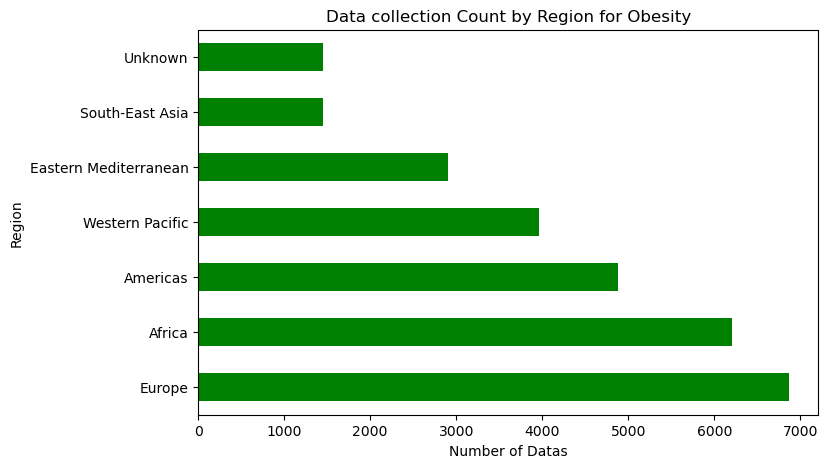

Region
Europe                   6864
Africa                   6204
Americas                 4884
Western Pacific          3960
Eastern Mediterranean    2904
South-East Asia          1452
Unknown                  1452
Name: count, dtype: int64

In [95]:
# data collection Count by region for obesity
data_counts_o = df_obesity['Region'].value_counts()
#Creat plot.
plt.figure(figsize=(8,5), num=1)
data_counts_o.plot(kind = 'barh', color='green')
plt.title('Data collection Count by Region for Obesity')
plt.xlabel('Number of Datas')
plt.ylabel('Region')
plt.show()
data_counts_o

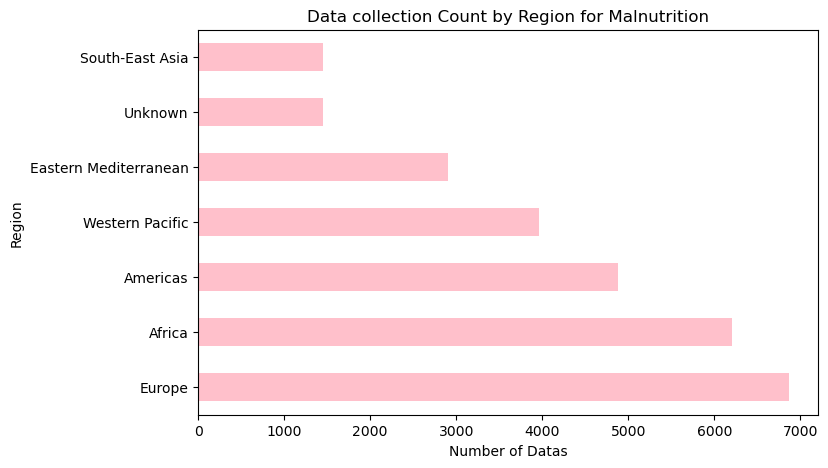

Region
Europe                   6864
Africa                   6204
Americas                 4884
Western Pacific          3960
Eastern Mediterranean    2904
Unknown                  1452
South-East Asia          1452
Name: count, dtype: int64

In [96]:
# data collection Count by region for malnutrition
data_counts_m = df_malnutrition['Region'].value_counts()
#Creat plot.
plt.figure(figsize=(8,5), num=2)
data_counts_m.plot(kind = 'barh', color='pink')
plt.title('Data collection Count by Region for Malnutrition')
plt.xlabel('Number of Datas')
plt.ylabel('Region')
plt.show()
data_counts_m

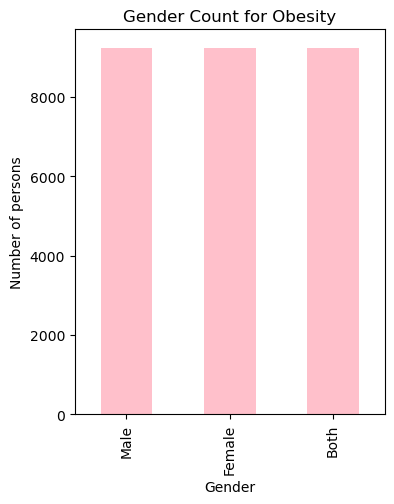

Gender
Male      9240
Female    9240
Both      9240
Name: count, dtype: int64

In [97]:
# Number of data collected by gender for obesity
data_Gender_O = df_obesity['Gender'].value_counts()
#Creat plot.
plt.figure(figsize=(4,5), num=3)
data_Gender_O.plot(kind = 'bar', color='pink')
plt.title('Gender Count for Obesity')
plt.xlabel('Gender')
plt.ylabel('Number of persons')
plt.show()
data_Gender_O

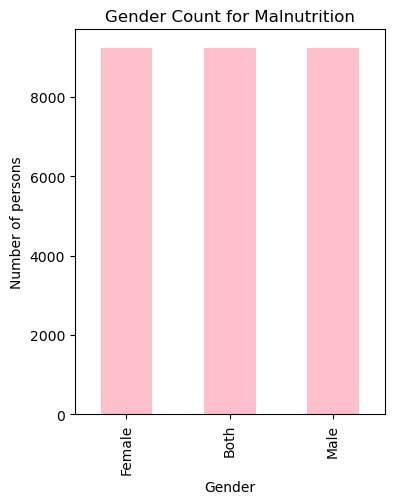

Gender
Female    9240
Both      9240
Male      9240
Name: count, dtype: int64

In [98]:
# Number of data collected by gender for malnutrition
data_Gender_M = df_malnutrition['Gender'].value_counts()
#Creat plot.
plt.figure(figsize=(4,5), num=4)
data_Gender_M.plot(kind = 'bar', color='pink')
plt.title('Gender Count for Malnutrition')
plt.xlabel('Gender')
plt.ylabel('Number of persons')
plt.show()
data_Gender_M

<Figure size 400x500 with 0 Axes>

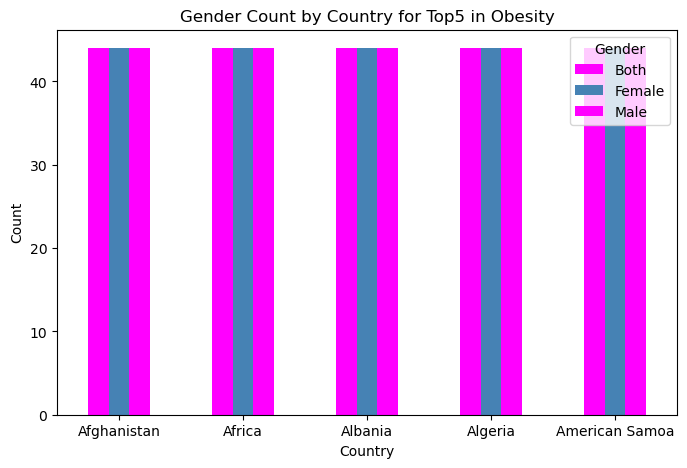

Gender,Both,Female,Male
Country,,,
Afghanistan,44,44,44
Africa,44,44,44
Albania,44,44,44
Algeria,44,44,44
American Samoa,44,44,44


In [99]:
gender_counts_o = df_obesity.groupby(['Country', 'Gender']).size().reset_index(name='Count')
gender_group_o = gender_counts_o.pivot(index='Country', columns='Gender', values='Count').head(5)

plt.figure(figsize=(4,5), num=5)
gender_group_o.plot(kind='bar', figsize=(8,5), color=['magenta', 'steelblue'])
plt.title('Gender Count by Country for Top5 in Obesity')
plt.xlabel('Country')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()
gender_group_o

<Figure size 400x500 with 0 Axes>

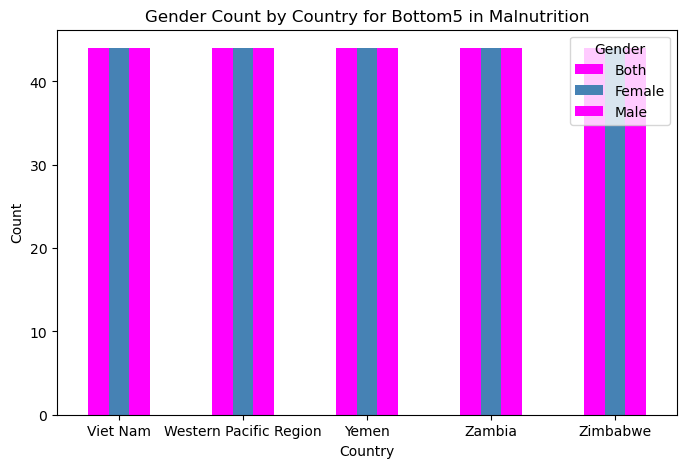

Gender,Both,Female,Male
Country,,,
Viet Nam,44,44,44
Western Pacific Region,44,44,44
Yemen,44,44,44
Zambia,44,44,44
Zimbabwe,44,44,44


In [100]:
gender_counts_m = df_malnutrition.groupby(['Country', 'Gender']).size().reset_index(name='Count')
gender_group_m = gender_counts_m.pivot(index='Country', columns='Gender', values='Count').tail(5)

plt.figure(figsize=(4,5), num=6)
gender_group_m.plot(kind='bar', figsize=(8,5), color=['magenta', 'steelblue'])
plt.title('Gender Count by Country for Bottom5 in Malnutrition')
plt.xlabel('Country')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()
gender_group_m

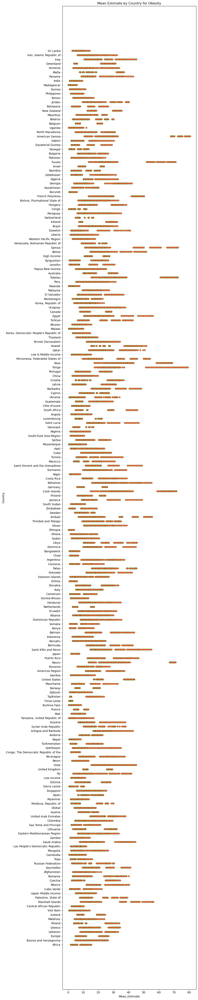

In [101]:
# Mean Estimate with country in Scatterplot for Obesity
plt.figure(figsize=(10,50), num=7)
sns.scatterplot(data=df_obesity, y='Country', x='Mean_Estimate', color='tomato', edgecolor='green')
plt.title('Mean Estimate by Country for Obesity')
plt.tight_layout()
plt.show()

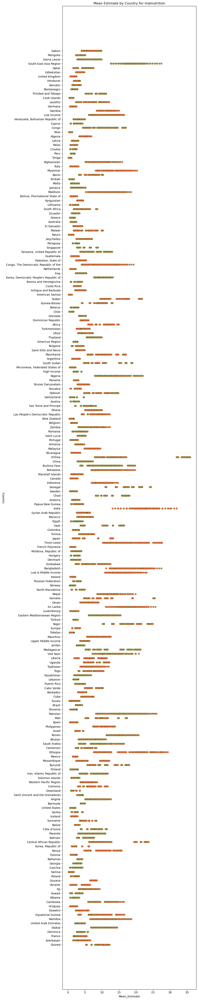

In [102]:
# Mean Estimate with country in Scatterplot for malnutrition
plt.figure(figsize=(10,50), num=8)
sns.scatterplot(data=df_malnutrition, y='Country', x='Mean_Estimate', color='tomato', edgecolor='green')
plt.title('Mean Estimate by Country for malnutrition')
plt.tight_layout()
plt.show()

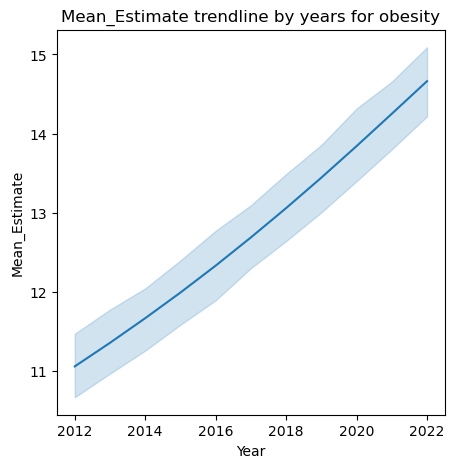

In [103]:
# Mean estimate trendline over the years for obesity 
plt.figure(figsize=(5,5), num=9)
sns.lineplot(data=df_obesity, x='year', y='Mean_Estimate')
plt.title('Mean_Estimate trendline by years for obesity')
plt.xlabel('Year')
plt.ylabel('Mean_Estimate')
plt.show()

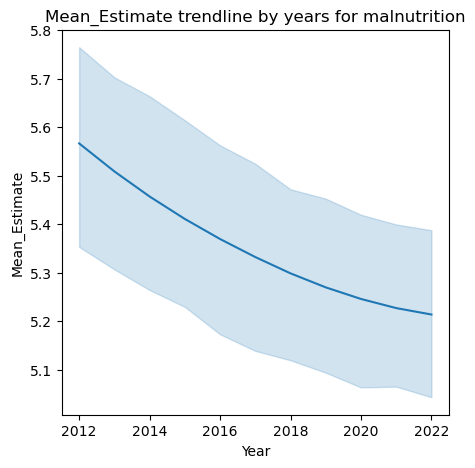

In [104]:
# Mean estimate trendline over the years for malnutrition
plt.figure(figsize=(5,5), num=10)
sns.lineplot(data=df_malnutrition, x='year', y='Mean_Estimate')
plt.title('Mean_Estimate trendline by years for malnutrition')
plt.xlabel('Year')
plt.ylabel('Mean_Estimate')
plt.show()

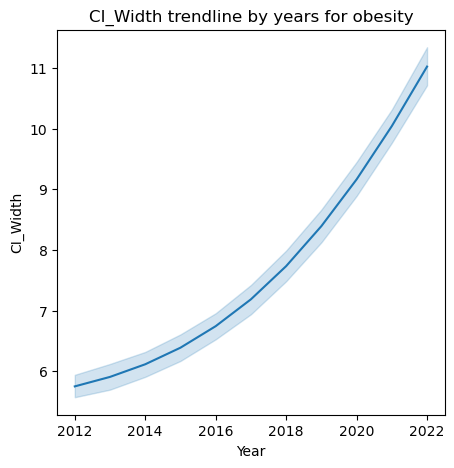

In [105]:
# CI_Width trendline over the years for obesity 
plt.figure(figsize=(5,5), num=11)
sns.lineplot(data=df_obesity, x='year', y='CI_Width')
plt.title('CI_Width trendline by years for obesity')
plt.xlabel('Year')
plt.ylabel('CI_Width')
plt.show()

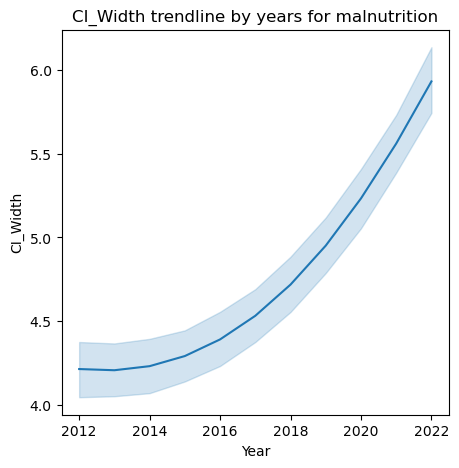

In [106]:
# CI_Width trendline over the years for malnutrition 
plt.figure(figsize=(5,5), num=12)
sns.lineplot(data=df_malnutrition, x='year', y='CI_Width')
plt.title('CI_Width trendline by years for malnutrition')
plt.xlabel('Year')
plt.ylabel('CI_Width')
plt.show()

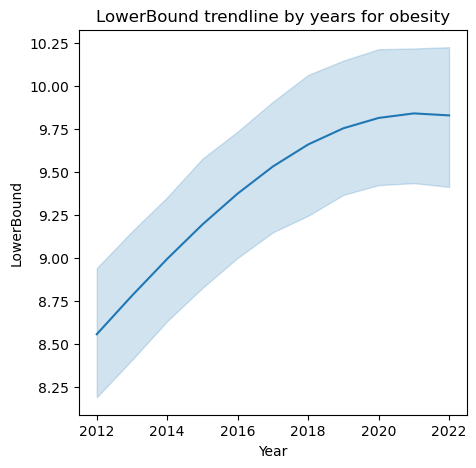

In [107]:
# LowerBound trendline over the years for obesity 
plt.figure(figsize=(5,5), num=13)
sns.lineplot(data=df_obesity, x='year', y='LowerBound')
plt.title('LowerBound trendline by years for obesity')
plt.xlabel('Year')
plt.ylabel('LowerBound')
plt.show()

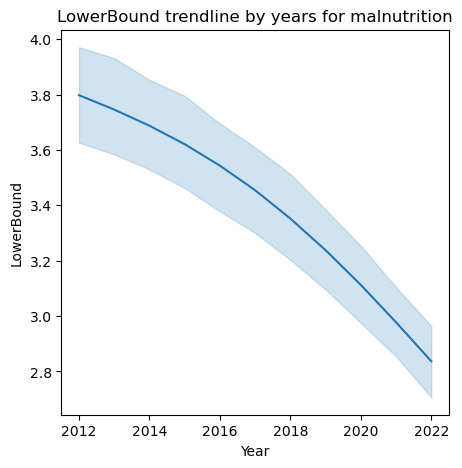

In [108]:
# LowerBound trendline over the years for malnutrition
plt.figure(figsize=(5,5), num=14)
sns.lineplot(data=df_malnutrition, x='year', y='LowerBound')
plt.title('LowerBound trendline by years for malnutrition')
plt.xlabel('Year')
plt.ylabel('LowerBound')
plt.show()

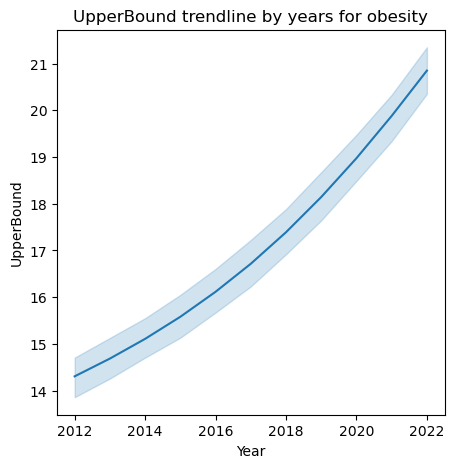

In [109]:
# UpperBound trendline over the years for obesity
plt.figure(figsize=(5,5), num=15)
sns.lineplot(data=df_obesity, x='year', y='UpperBound')
plt.title('UpperBound trendline by years for obesity')
plt.xlabel('Year')
plt.ylabel('UpperBound')
plt.show()

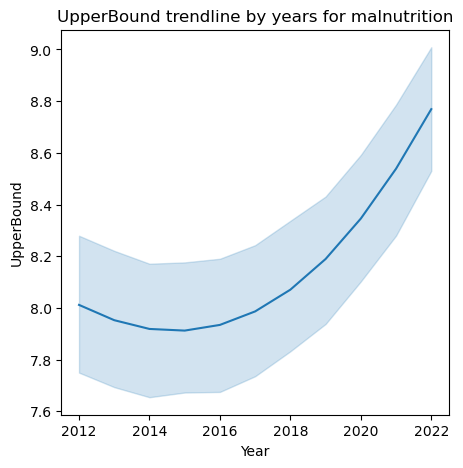

In [110]:
# UpperBound trendline over the years for malnutrition
plt.figure(figsize=(5,5), num=16)
sns.lineplot(data=df_malnutrition, x='year', y='UpperBound')
plt.title('UpperBound trendline by years for malnutrition')
plt.xlabel('Year')
plt.ylabel('UpperBound')
plt.show()

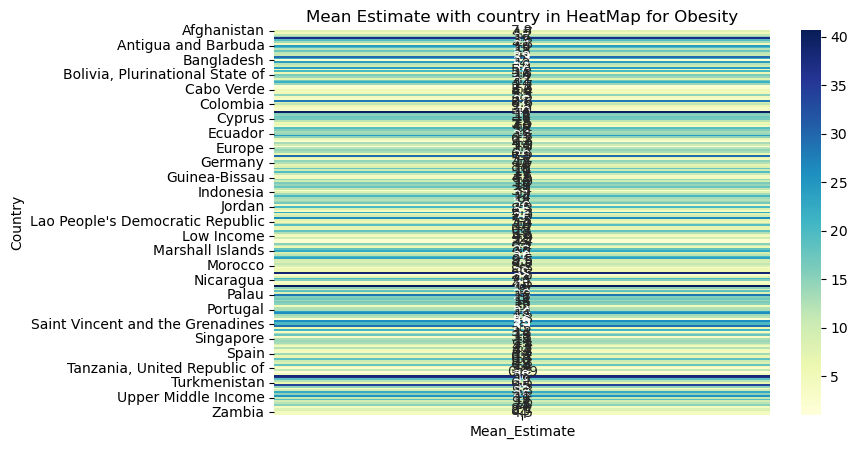

                        Mean_Estimate
Country                              
Afghanistan                  7.763365
Africa                       4.672290
Albania                     10.947071
Algeria                     15.051907
American Samoa              36.892015
...                               ...
Viet Nam                     4.042492
Western Pacific Region       8.085531
Yemen                        8.681012
Zambia                       4.526529
Zimbabwe                     4.036550

[210 rows x 1 columns]


In [111]:
# Mean Estimate with country in HeatMap for Obesity
heatmap_data_o = df_obesity.pivot_table(index='Country', values='Mean_Estimate')
#Creat Plot.
plt.figure(figsize=(8,5), num=17)
sns.heatmap(heatmap_data_o, annot=True, cmap='YlGnBu')
plt.title('Mean Estimate with country in HeatMap for Obesity')
plt.show()
print(heatmap_data_o)

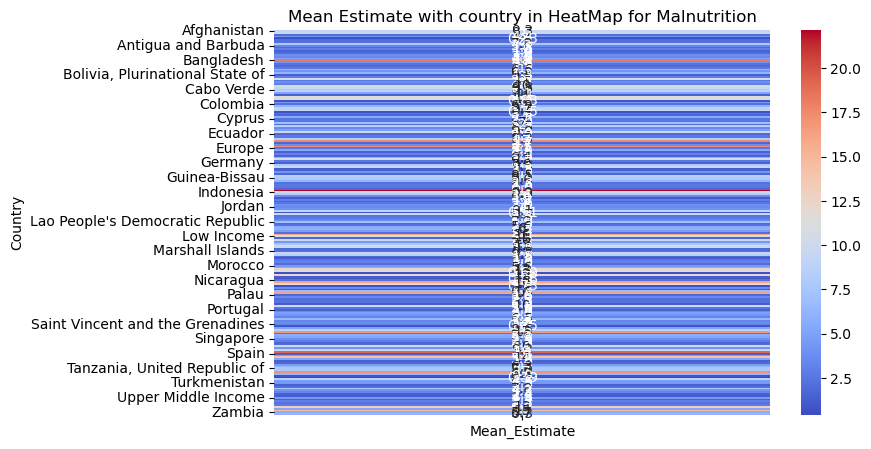

,Mean_Estimate
Country,
Afghanistan,9.263801
Africa,9.739446
Albania,1.996792
Algeria,4.365333
American Samoa,0.730369
...,...
Viet Nam,12.928028
Western Pacific Region,5.283883
Yemen,14.708134


In [112]:
# Mean Estimate with country in HeatMap for Malnutrition
heatmap_data_m = df_malnutrition.pivot_table(index='Country', values='Mean_Estimate')
#Creat Plot.
plt.figure(figsize=(8,5), num=18)
sns.heatmap(heatmap_data_m, annot=True, cmap='coolwarm')
plt.title('Mean Estimate with country in HeatMap for Malnutrition')
plt.show()
heatmap_data_m

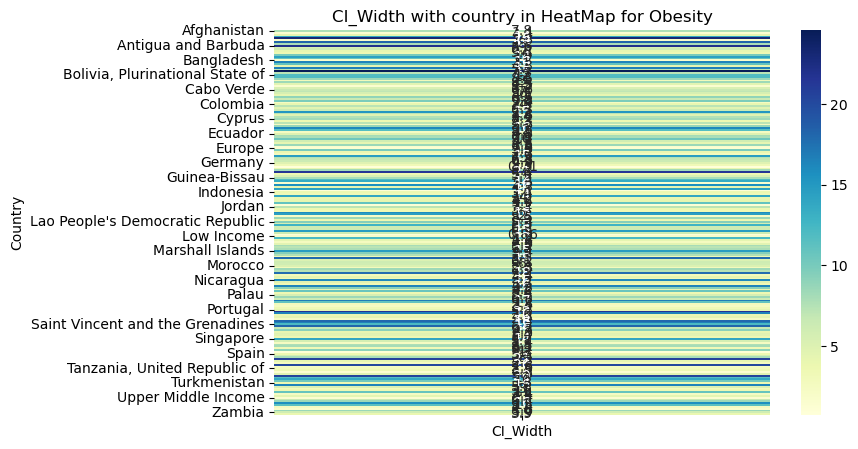

,CI_Width
Country,
Afghanistan,7.753123
Africa,1.417837
Albania,4.418251
Algeria,13.807120
American Samoa,23.113530
...,...
Viet Nam,2.422444
Western Pacific Region,1.776626
Yemen,8.614729


In [113]:
# CI_Width with country in HeatMap for Obesity
heatmap_data_co = df_obesity.pivot_table(index='Country', values='CI_Width')
#Creat Plot.
plt.figure(figsize=(8,5), num=19)
sns.heatmap(heatmap_data_co, annot=True, cmap='YlGnBu')
plt.title('CI_Width with country in HeatMap for Obesity')
plt.show()
heatmap_data_co

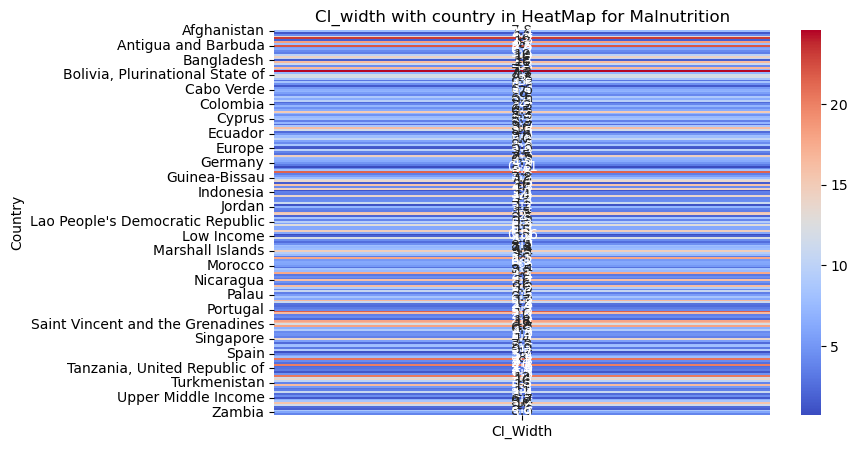

In [114]:
# CI_width with country in HeatMap for Malnutrition
heatmap_data_m = df_obesity.pivot_table(index='Country', values='CI_Width')
#Creat Plot.
plt.figure(figsize=(8,5), num=20)
sns.heatmap(heatmap_data_m, annot=True, cmap='coolwarm')
plt.title('CI_width with country in HeatMap for Malnutrition')
plt.show()

## Step_4: Insert Data into SQL and Query Writing
MySQL

### Insert Data into SQL

In [115]:
#To connect the mysql with python: need the connector (First install the connector and use the import mysql.conncetor to use)
#!pip install mysql-connector-python # type: ignore
%pip install mysql-connector-python 

Note: you may need to restart the kernel to use updated packages.


In [116]:
#Creat and access to the user.
#create user 'username'@'localhost' identified by 'password';
#grant all privileges on mini_project_2.* to 'username'@'localhost';

import mysql.connector 
try:
    conn = mysql.connector.connect(
        host = 'localhost',
        user = 'vikram',
        password = 'Vikram',
        database = 'mini_project_2',
        auth_plugin = 'mysql_native_password'
    )
    cursor = conn.cursor()
    print('Connection established and cursor created.')
except mysql.connector.Error as err:
    print(f'Error connecting to MySQL:{err}')
    # If the connection fails, there's nothing else to do, so exit
    exit()

Connection established and cursor created.


In [117]:
from mysql.connector import Error

In [118]:
# After connected to the database 
cursor.execute('create table if not exists df_obesity (Year int, Gender varchar(10), Mean_Estimate decimal(9,7), LowerBound decimal(9,7), UpperBound decimal(9,7), Age_Group varchar(8), Country varchar(150), Region varchar(150), CI_Width decimal(9,7), Obesity_level varchar(50))')

In [119]:
# After connected to the database 
cursor.execute('create table if not exists df_malnutrition (Year int, Gender varchar(10), Mean_Estimate decimal(9,7), LowerBound decimal(9,7), UpperBound decimal(9,7), Age_Group varchar(8), Country varchar(150), Region varchar(150), CI_Width decimal(9,7), Malnutrition_level varchar(50))')

In [120]:
insert_sql = 'INSERT INTO df_obesity (Year, Gender, Mean_Estimate, LowerBound, UpperBound, Age_Group, Country, Region, CI_Width, Obesity_level) VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s)'

In [121]:
for index, row in df_obesity.iterrows():
    data_to_insert = (row['year'], row['Gender'], row['Mean_Estimate'], row['LowerBound'], row['UpperBound'], row['age_group'], row['Country'], row['Region'], row['CI_Width'], row['Obesity_Level'])
    try:
        cursor.execute(insert_sql, data_to_insert)
        print(f"Inserted row {index}: {data_to_insert}")
    except Error as err:
        print(f"Error inserting row {index} ({data_to_insert}):{err}")
        conn.rollback()
        continue

conn.commit()
print('\nAll data insertion attempts completed. Changes committed.')

Inserted row 1: (2013, 'Male', 3.6820371, 3.0044626, 4.3995064, 'adults', 'Sri Lanka', 'South-East Asia', 1.3950437999999998, 'Low')
Inserted row 4: (2020, 'Male', 17.487641, 15.793777, 19.245727, 'adults', 'Iran, Islamic Republic of', 'Eastern Mediterranean', 3.4519499999999983, 'Low')
Inserted row 11: (2020, 'Male', 28.33553, 23.089589, 33.815336, 'adults', 'Iraq', 'Eastern Mediterranean', 10.725747000000002, 'Moderate')
Inserted row 17: (2014, 'Female', 27.948704, 24.924766, 31.21326, 'adults', 'Greenland', 'Europe', 6.2884939999999965, 'Moderate')
Inserted row 19: (2019, 'Female', 31.893221, 28.160682, 35.574925, 'adults', 'Armenia', 'Europe', 7.414242999999999, 'High')
Inserted row 20: (2018, 'Both', 33.694205, 29.905805, 37.470856, 'adults', 'Malta', 'Europe', 7.565050999999997, 'High')
Inserted row 23: (2021, 'Female', 41.919816, 37.527829, 46.368906, 'adults', 'Panama', 'Americas', 8.841077000000006, 'High')
Inserted row 24: (2015, 'Both', 4.7784548, 4.5057103, 5.061039, 'adult

In [122]:
insert_sql_m = 'INSERT INTO df_malnutrition (Year, Gender, Mean_Estimate, LowerBound, UpperBound, Age_Group, Country, Region, CI_Width, Malnutrition_level) VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s)'

In [123]:
for index, row in df_malnutrition.iterrows():
    data_to_insert = (row['year'], row['Gender'], row['Mean_Estimate'], row['LowerBound'], row['UpperBound'], row['age_group'], row['Country'], row['Region'], row['CI_Width'], row['Malnutrition_Level'])
    try:
        cursor.execute(insert_sql_m, data_to_insert)
        print(f"Inserted row {index}: {data_to_insert}")
    except Error as err:
        print(f"Error inserting row {index} ({data_to_insert}):{err}")
        conn.rollback()
        continue

conn.commit()
print('\nAll data insertion attempts completed. Changes committed.')

Inserted row 0: (2021, 'Female', 5.7951104, 3.9720364, 8.0770209, 'adults', 'Gabon', 'Africa', 4.1049845000000005, 'Low')
Inserted row 4: (2017, 'Both', 3.0906517, 2.4282299, 3.8421549, 'adults', 'Mongolia', 'Western Pacific', 1.4139250000000003, 'Low')
Inserted row 5: (2016, 'Female', 8.3717242, 6.6556677, 10.253121, 'adults', 'Sierra Leone', 'Africa', 3.5974532999999997, 'Low')
Inserted row 7: (2021, 'Both', 13.336353, 12.242323, 14.442866, 'adults', 'South-East Asia Region', 'Unknown', 2.2005429999999997, 'Low')
Inserted row 9: (2014, 'Male', 2.2080697, 1.2538434, 3.516819, 'adults', 'Qatar', 'Eastern Mediterranean', 2.2629756, 'Low')
Inserted row 18: (2016, 'Male', 2.4850998, 1.620023, 3.592917, 'adults', 'Uzbekistan', 'Europe', 1.972894, 'Low')
Inserted row 19: (2016, 'Male', 1.2865148, 1.0809125, 1.5171215, 'adults', 'United Kingdom', 'Europe', 0.43620900000000007, 'Low')
Inserted row 21: (2017, 'Both', 3.0539786, 1.7532352, 5.0046701, 'adults', 'Honduras', 'Americas', 3.25143490

### Query

In [124]:
from sqlalchemy import create_engine
# --- MySQL Connection Details ---
DB_USER = 'vikram'
DB_PASSWORD = 'Vikram'
DB_HOST = 'localhost'
DB_PORT = 3306
DB_NAME = 'mini_project_2' 

# --- Create SQLAlchemy Engine ---
# This engine will be used by pandas.read_sql()
try:
    # Using mysql-connector-python
    engine = create_engine(f'mysql+mysqlconnector://{DB_USER}:{DB_PASSWORD}@{DB_HOST}:{DB_PORT}/{DB_NAME}')
    print("SQLAlchemy Engine created successfully.")

    print("Attempting to connect to the database...")
    with engine.connect() as connection:
        test_query = "SELECT 1"
        cursor = connection.connection.cursor() # Access the underlying DBAPI cursor
        cursor.execute(test_query)
        result = cursor.fetchone()[0] # Fetch the first row, first column
        cursor.close()

        if result == 1:
            print("Successfully connected to MySQL database and executed a test query.")
        else:
            print(f"Connection test failed. Unexpected result: {result}")

except Exception as e:
    print(f"ERROR: Failed to connect or execute test query.")
    print(f"Please check your MySQL server status, credentials, and firewall settings.")
    print(f"Full error details: {e}")
    engine = None # Set engine to None if connection fails to prevent further errors

# Define your table name
OBESITY_TABLE = 'df_obesity'

if engine is None:
    print("\nWARNING: Database engine not initialized. Subsequent queries will be skipped.")

SQLAlchemy Engine created successfully.
Attempting to connect to the database...
Successfully connected to MySQL database and executed a test query.


#### Obesity

In [149]:
if engine:
    print("--- Query 1: Top 5 regions with highest average obesity in 2022 ---")
    query_1 = f"""
    SELECT region, AVG(Mean_estimate) AS avg_obesity
    FROM {OBESITY_TABLE}
    WHERE year = 2022 -- Ensure you have data for 2022, or use (SELECT MAX(year) FROM {OBESITY_TABLE})
    GROUP BY region
    ORDER BY avg_obesity DESC
    LIMIT 5;
    """
    df_q1 = pd.read_sql(query_1, engine)
    print(df_q1)
else:
    print("Database connection not established. Skipping query.")

--- Query 1: Top 5 regions with highest average obesity in 2022 ---
                  region  avg_obesity
0        Western Pacific    23.009388
1               Americas    21.213601
2  Eastern Mediterranean    18.126910
3                 Europe    12.987338
4                Unknown    11.462648


In [126]:
if engine:
    print("--- Query 2: Top 5 countries with highest obesity estimates ---")
    query_2 = f"""
    SELECT country, AVG(Mean_estimate) AS avg_obesity_estimate
    FROM {OBESITY_TABLE}
    GROUP BY country
    ORDER BY avg_obesity_estimate DESC
    LIMIT 5;
    """
    df_q2 = pd.read_sql(query_2, engine)
    print(df_q2)
else:
    print("Database connection not established. Skipping query.")

--- Query 2: Top 5 countries with highest obesity estimates ---
          country  avg_obesity_estimate
0            Niue             40.664873
1    Cook Islands             39.917173
2           Nauru             38.512101
3         Tokelau             37.960966
4  American Samoa             36.892015


In [127]:
if engine:
    print("--- Query 3: Obesity trend in India over the years ---")
    query_3 = f"""
    SELECT year, Mean_estimate
    FROM {OBESITY_TABLE}
    WHERE country = 'India'
      AND gender = 'Both' -- Adjust if your data structure is different
      AND age_group = 'All Ages' -- Adjust if your data structure is different
    ORDER BY year ASC;
    """
    df_q3 = pd.read_sql(query_3, engine)
    print(df_q3)
else:
    print("Database connection not established. Skipping query.")

--- Query 3: Obesity trend in India over the years ---
Empty DataFrame
Columns: [year, Mean_estimate]
Index: []


In [128]:
if engine:
    print("--- Query 4: Average obesity by gender ---")
    query_4 = f"""
    SELECT gender, AVG(Mean_estimate) AS avg_obesity
    FROM {OBESITY_TABLE}
    WHERE gender IN ('Male', 'Female') -- Exclude 'Both' or other aggregate gender categories
    GROUP BY gender;
    """
    df_q4 = pd.read_sql(query_4, engine)
    print(df_q4)
else:
    print("Database connection not established. Skipping query.")

--- Query 4: Average obesity by gender ---
   gender  avg_obesity
0    Male    12.776696
1  Female    12.724456


In [129]:
if engine:
    print("--- Query 5: Country count by obesity level category and age group ---")
    query_5 = f"""
    SELECT Obesity_level, age_group, COUNT(DISTINCT country) AS num_countries
    FROM {OBESITY_TABLE}
    WHERE Obesity_level IS NOT NULL AND age_group IS NOT NULL
    GROUP BY Obesity_level, age_group
    ORDER BY Obesity_level, age_group;
    """
    df_q5 = pd.read_sql(query_5, engine) # Use query_5_with_case if you need the CASE statement
    print(df_q5)
else:
    print("Database connection not established. Skipping query.")

--- Query 5: Country count by obesity level category and age group ---
  Obesity_level age_group  num_countries
0          High    adults             94
1          High  childern             11
2           Low    adults            176
3           Low  childern            210
4      Moderate    adults             99
5      Moderate  childern             26


In [130]:
if engine:
    print("--- Query 6: Top 5 least reliable countries (highest avg CI_Width) ---")
    query_6a = f"""
    SELECT country, AVG(CI_Width) AS avg_ci_width
    FROM {OBESITY_TABLE}
    WHERE CI_Width IS NOT NULL
    GROUP BY country
    ORDER BY avg_ci_width DESC
    LIMIT 5;
    """
    df_q6a = pd.read_sql(query_6a, engine)
    print(df_q6a)

    print("--- Query 6: Top 5 most consistent countries (smallest avg CI_Width) ---")
    query_6b = f"""
    SELECT country, AVG(CI_Width) AS avg_ci_width
    FROM {OBESITY_TABLE}
    WHERE CI_Width IS NOT NULL
    GROUP BY country
    ORDER BY avg_ci_width ASC
    LIMIT 5;
    """
    df_q6b = pd.read_sql(query_6b, engine)
    print(df_q6b)
else:
    print("Database connection not established. Skipping query.")

--- Query 6: Top 5 least reliable countries (highest avg CI_Width) ---
               country  avg_ci_width
0              Bermuda     24.593417
1       American Samoa     23.113530
2  Antigua and Barbuda     22.016214
3          Puerto Rico     21.698679
4              Grenada     21.458487
--- Query 6: Top 5 most consistent countries (smallest avg CI_Width) ---
                  country  avg_ci_width
0                  Global      0.708953
1     Low & Middle Income      0.861060
2  South-East Asia Region      1.017775
3                   India      1.140133
4                   Japan      1.155903


In [131]:
if engine:
    print("--- Query 7: Average obesity by age group ---")
    query_7 = f"""
    SELECT age_group, AVG(Mean_estimate) AS avg_obesity
    FROM {OBESITY_TABLE}
    WHERE age_group IS NOT NULL AND Mean_estimate IS NOT NULL
    GROUP BY age_group
    ORDER BY age_group;
    """
    df_q7 = pd.read_sql(query_7, engine)
    print(df_q7)
else:
    print("Database connection not established. Skipping query.")

--- Query 7: Average obesity by age group ---
  age_group  avg_obesity
0    adults    21.833223
1  childern     9.736979


In [132]:
if engine:
    print("\n--- Query 8: Top 10 Countries with consistent low obesity ---")
    query_8 = f"""
    SELECT country, AVG(Mean_estimate) AS avg_obesity, AVG(CI_Width) AS avg_ci_width
    FROM {OBESITY_TABLE}
    WHERE Mean_estimate IS NOT NULL AND CI_Width IS NOT NULL
    GROUP BY country
    ORDER BY avg_obesity ASC, avg_ci_width ASC
    LIMIT 10;
    """
    df_q8 = pd.read_sql(query_8, engine)
    print(df_q8)
else:
    print("Database connection not established. Skipping query.")


--- Query 8: Top 10 Countries with consistent low obesity ---
        country  avg_obesity  avg_ci_width
0   Timor-Leste     0.994067      1.273569
1      Ethiopia     1.491994      1.589414
2  Burkina Faso     1.721496      1.531514
3        Rwanda     1.767194      2.360579
4    Bangladesh     1.976673      1.663506
5    Madagascar     1.984110      4.356886
6       Burundi     2.304665      5.198043
7        Malawi     2.391324      2.632714
8         Nepal     2.494255      3.098051
9       Eritrea     2.770560      5.870395


In [133]:
if engine:
    print("--- Query 9: Countries where female obesity exceeds male by large margin (same year) ---")
    # Ensure your data has distinct rows for 'Male' and 'Female' for comparison
    query_9 = f"""
    SELECT
        t1.country,
        t1.year,
        t1.Mean_estimate AS female_obesity,
        t2.Mean_estimate AS male_obesity,
        (t1.Mean_estimate - t2.Mean_estimate) AS female_vs_male_difference
    FROM
        {OBESITY_TABLE} t1
    JOIN
        {OBESITY_TABLE} t2 ON t1.country = t2.country AND t1.year = t2.year
    WHERE
        t1.gender = 'Female' AND t2.gender = 'Male'
        AND (t1.Mean_estimate - t2.Mean_estimate) > 5 -- Define your "large margin" here (e.g., 5 percentage points)
        AND t1.Mean_estimate IS NOT NULL AND t2.Mean_estimate IS NOT NULL
    ORDER BY
        female_vs_male_difference DESC;
    """
    df_q9 = pd.read_sql(query_9, engine)
    print(df_q9)
else:
    print("Database connection not established. Skipping query.")

--- Query 9: Countries where female obesity exceeds male by large margin (same year) ---
                     country  year  female_obesity  male_obesity  \
0             American Samoa  2012       76.983809     23.729610   
1             American Samoa  2012       76.983809     23.866493   
2             American Samoa  2012       76.983809     24.116910   
3             American Samoa  2013       77.297693     24.599233   
4             American Samoa  2013       77.297693     24.727380   
...                      ...   ...             ...           ...   
7373               Indonesia  2021       15.544349     10.537361   
7374                  Brazil  2017       27.254888     22.249368   
7375                 Denmark  2018       11.921830      6.917784   
7376  Bosnia and Herzegovina  2021       25.896215     20.892647   
7377                  Guinea  2017        8.750679      3.750635   

      female_vs_male_difference  
0                     53.254199  
1                     53.1

In [134]:
if engine:
    print("--- Query 10: Global average obesity percentage per year ---")
    query_10 = f"""
    SELECT year, AVG(Mean_estimate) AS global_avg_obesity_percentage
    FROM {OBESITY_TABLE}
    WHERE Mean_estimate IS NOT NULL
    GROUP BY year
    ORDER BY year ASC;
    """
    df_q10 = pd.read_sql(query_10, engine)
    print(df_q10)
else:
    print("Database connection not established. Skipping query.")

--- Query 10: Global average obesity percentage per year ---
    year  global_avg_obesity_percentage
0   2012                      11.061969
1   2013                      11.359637
2   2014                      11.670343
3   2015                      11.994231
4   2016                      12.333907
5   2017                      12.689997
6   2018                      13.060296
7   2019                      13.444604
8   2020                      13.843002
9   2021                      14.250923
10  2022                      14.662533


#### Malnutrition

In [135]:
if engine:
    print('---Query 11: Avg.malnutrition by age group---')
    query_11 = f"""
    SELECT Age_Group, AVG(Mean_Estimate) AS average_malnutrition
    FROM df_malnutrition
    WHERE Age_Group IS NOT NULL
    GROUP BY Age_Group
    ORDER BY Age_Group; 
    """
    df_q11 = pd.read_sql(query_11, engine)
    print(df_q11)
else:
    print("Database conneciton not established. Skipping query.")

---Query 11: Avg.malnutrition by age group---
  Age_Group  average_malnutrition
0    adults              5.940619
1  children              5.159062


In [136]:
if engine:
    print('---Query 12: Top 5 countries with highest malnutrition(mean_estimate)---')
    query_12 = f'''
    SELECT country, AVG(Mean_Estimate) AS avg_malnutrition_estimate
    FROM df_malnutrition
    GROUP BY Country
    ORDER BY avg_malnutrition_estimate DESC
    LIMIT 5; 
    '''
    df_q12 = pd.read_sql(query_12, engine)
    print(df_q12)
else:
    print("Database conneciton not established. Skipping query.")

---Query 12: Top 5 countries with highest malnutrition(mean_estimate)---
                  country  avg_malnutrition_estimate
0                   India                  22.142361
1  South-East Asia Region                  19.238903
2              Bangladesh                  18.245768
3               Sri Lanka                  17.871907
4                 Eritrea                  17.472508


In [137]:
if engine:
    print('---Query 13: Malnutrition trend in African region over the years---')
    query_13 = f'''
    SELECT Year AS years, 
    AVG(Mean_Estimate) AS avg_malnutrition_africa
    FROM df_malnutrition
    WHERE Region = 'Africa'
    GROUP BY Year
    ORDER BY Year ASC; 
    '''
    df_q13 = pd.read_sql(query_13, engine)
    print(df_q13)
else:
    print("Database conneciton not established. Skipping query.")

---Query 13: Malnutrition trend in African region over the years---
    years  avg_malnutrition_africa
0    2012                 8.849655
1    2013                 8.749857
2    2014                 8.662762
3    2015                 8.587719
4    2016                 8.523125
5    2017                 8.466465
6    2018                 8.414722
7    2019                 8.369700
8    2020                 8.331320
9    2021                 8.298626
10   2022                 8.270096


In [138]:
if engine:
    print('---Query 14: Gender-based average malnutrition---')
    query_14 = f'''
    SELECT Gender, 
    AVG(Mean_Estimate) AS avg_malnutrition_gender
    FROM df_malnutrition
    GROUP BY Gender;
    '''
    df_q14 = pd.read_sql(query_14, engine)
    print(df_q14)
else:
    print("Database conneciton not established. Skipping query.")

---Query 14: Gender-based average malnutrition---
   Gender  avg_malnutrition_gender
0  Female                 4.675483
1    Both                 5.361553
2    Male                 6.026317


In [139]:
print('---Query 15: Malnutrition level-wise (average CI_Width by age group)---')
query_15 = f'''
SELECT Malnutrition_level, Age_Group, AVG(CI_Width) AS avg_CI_Width
FROM df_malnutrition
WHERE Malnutrition_level IS NOT NULL AND Age_Group IS NOT NULL
GROUP BY Malnutrition_level, Age_Group;
'''
df_q15 = pd.read_sql(query_15, engine)
print(df_q15)

---Query 15: Malnutrition level-wise (average CI_Width by age group)---
  Malnutrition_level Age_Group  avg_CI_Width
0                Low    adults      3.608206
1               High    adults     13.289682
2           Moderate    adults     11.206546
3                Low  children      5.101265
4           Moderate  children      6.089770
5               High  children      3.198873


In [140]:
print('---Query 16: Yearly malnutrition change in specific countries (India, Nigeria, Brazil)---')
query_16 = f'''
SELECT
Country,
Year,
Mean_Estimate AS current_year_malnutrition,
LAG(Mean_Estimate, 1, NULL) OVER (PARTITION BY Country ORDER BY Year) AS previous_year_malnutrition,
Mean_Estimate - LAG(Mean_Estimate, 1, NULL) OVER (PARTITION BY Country ORDER BY Year) AS yearly_change
FROM df_malnutrition
WHERE Country IN ('India', 'Nigeria', 'Brazil')
AND Mean_Estimate IS NOT NULL
ORDER BY Country, Year ASC;
'''
df_q16 = pd.read_sql(query_16, engine)
print(df_q16)

---Query 16: Yearly malnutrition change in specific countries (India, Nigeria, Brazil)---
     Country  Year  current_year_malnutrition  previous_year_malnutrition  \
0     Brazil  2012                   3.027895                         NaN   
1     Brazil  2012                   2.582618                    3.027895   
2     Brazil  2012                   2.545835                    2.582618   
3     Brazil  2012                   2.691234                    2.545835   
4     Brazil  2012                   2.875189                    2.691234   
..       ...   ...                        ...                         ...   
391  Nigeria  2022                  11.384269                   12.827678   
392  Nigeria  2022                  18.538181                   11.384269   
393  Nigeria  2022                   9.616382                   18.538181   
394  Nigeria  2022                   9.593839                    9.616382   
395  Nigeria  2022                  21.980971                  

In [141]:
print('---Query 18: Country with increasing malnutrition---')
query_18 = f'''
SELECT
    Country,
    MIN(Mean_Estimate) AS lowest_recorded_malnutrition,
    MAX(Mean_Estimate) AS highest_recorded_malnutrition
FROM df_malnutrition
WHERE Mean_Estimate IS NOT NULL
GROUP BY Country
HAVING highest_recorded_malnutrition > lowest_recorded_malnutrition
ORDER BY (highest_recorded_malnutrition - lowest_recorded_malnutrition) DESC;
'''
df_q18 = pd.read_sql(query_18, engine)
print(df_q18)

---Query 18: Country with increasing malnutrition---
            Country  lowest_recorded_malnutrition  \
0           Eritrea                      7.868055   
1          Ethiopia                      7.553969   
2           Somalia                      4.688896   
3             India                     13.073501   
4          Pakistan                      8.213687   
..              ...                           ...   
205    Cook Islands                      0.449898   
206            Peru                      0.825172   
207  American Samoa                      0.246522   
208            Niue                      0.353357   
209           Tonga                      0.175309   

     highest_recorded_malnutrition  
0                        35.894114  
1                        29.304048  
2                        25.521731  
3                        31.900835  
4                        25.950593  
..                             ...  
205                       1.637155  
206           

In [142]:
print('---Query 19: Min/Max malnutrition levels year-wise comparison---')
query_19 = f'''
SELECT
    year,
    MIN(Mean_Estimate) AS min_malnutrition,
    MAX(Mean_Estimate) AS max_malnutrition
FROM df_malnutrition
WHERE Mean_Estimate IS NOT NULL
GROUP BY Year
ORDER BY Year ASC;
'''
df_q19 = pd.read_sql(query_19, engine)
print(df_q19)

---Query 19: Min/Max malnutrition levels year-wise comparison---
    year  min_malnutrition  max_malnutrition
0   2012          0.175309         35.894114
1   2013          0.176421         35.694364
2   2014          0.177772         35.498199
3   2015          0.178445         35.312954
4   2016          0.178804         35.147691
5   2017          0.179286         34.997904
6   2018          0.179796         34.856236
7   2019          0.180428         34.715995
8   2020          0.181989         34.578446
9   2021          0.184718         34.429225
10  2022          0.188174         34.261948


In [143]:
print('---Query 20: High CI_Width flags for monitoring (CI_width>5)---')
query_20 = f'''
SELECT
    Country,
    Year,
    Age_Group,
    Gender,
    Mean_Estimate,
    CI_Width
FROM df_malnutrition
WHERE CI_Width > 5 AND CI_Width IS NOT NULL
ORDER BY CI_Width DESC, Country, year;
'''
df_q20 = pd.read_sql(query_20, engine)
print(df_q20)

---Query 20: High CI_Width flags for monitoring (CI_width>5)---
           Country  Year Age_Group  Gender  Mean_Estimate   CI_Width
0          Senegal  2022  children    Male      16.941771  26.701744
1          Senegal  2021  children    Male      16.992038  25.679344
2          Senegal  2020  children    Male      17.046429  24.586366
3       Mauritania  2022  children    Male      16.080868  23.810544
4          Senegal  2019  children    Male      17.105949  23.466898
...            ...   ...       ...     ...            ...        ...
9567        Jordan  2019  children  Female       3.876585   5.001890
9568       Comoros  2018  children  Female       3.272964   5.001566
9569   Philippines  2021  children  Female       7.551254   5.001525
9570  Sierra Leone  2021  children    Male       4.989996   5.000505
9571     Singapore  2014  children    Both       2.721901   5.000001

[9572 rows x 6 columns]


#### Combined Query

In [150]:
print('---Query 21: Obestiy vs malnutrition comparison by country (any countries)---')
query_21 = f'''
SELECT
    o.Country,
    o.Year,
    AVG(o.Mean_Estimate) AS avg_obesity,
    AVG(m.Mean_Estimate) AS avg_malnutrition
FROM
    df_obesity o
JOIN
    df_malnutrition m ON o.Country = m.Country AND o.Year = m.Year
WHERE
    o.Country IN ('India', 'China', 'United States', 'Brazil', 'Nigeria')
    AND o.Mean_Estimate IS NOT NULL AND m.Mean_Estimate IS NOT NULL
GROUP BY
    o.Country,
    o.Year
ORDER BY
    o.Country,
    o.Year;
'''
df_q21 = pd.read_sql(query_21, engine)
print(df_q21)

---Query 21: Obestiy vs malnutrition comparison by country (any countries)---
          Country  Year  avg_obesity  avg_malnutrition
0          Brazil  2012    13.480741          2.838653
1          Brazil  2013    14.112613          2.781388
2          Brazil  2014    14.750468          2.735034
3          Brazil  2015    15.385546          2.698947
4          Brazil  2016    16.007252          2.672241
5          Brazil  2017    16.620549          2.653566
6          Brazil  2018    17.231877          2.641574
7          Brazil  2019    17.845024          2.634594
8          Brazil  2020    18.468431          2.629412
9          Brazil  2021    19.100135          2.626637
10         Brazil  2022    19.740667          2.626854
11          China  2012     6.201951          5.080563
12          China  2013     6.666022          4.903684
13          China  2014     7.131323          4.737268
14          China  2015     7.596238          4.578604
15          China  2016     8.063722      

In [145]:
print('---Query 22: Gender-based disparity in both obesity and malnutrition---')
query_22 = f'''
WITH AvgObesityByGender AS (
    SELECT
        Gender,
        AVG(Mean_Estimate) AS avg_obesity
    FROM df_obesity
    WHERE Gender IN ('Male', 'Female', 'Both') AND Mean_Estimate IS NOT NULL
    GROUP BY Gender
),
AvgMalnutritionByGender AS (
    SELECT
        Gender,
        AVG(Mean_Estimate) AS avg_malnutrition
    FROM df_malnutrition
    WHERE Gender IN ('Male', 'Female', 'Both') AND Mean_Estimate IS NOT NULL
    GROUP BY Gender
)
SELECT
    o.Gender,
    o.avg_obesity,
    m.avg_malnutrition,
    (o.avg_obesity - m.avg_malnutrition) AS obesity_malnutrition_difference
FROM
    AvgObesityByGender o
JOIN
    AvgMalnutritionByGender m ON o.Gender = m.Gender
ORDER BY o.Gender;
'''
df_q22 = pd.read_sql(query_22, engine)
print(df_q22)

---Query 22: Gender-based disparity in both obesity and malnutrition---
   Gender  avg_obesity  avg_malnutrition  obesity_malnutrition_difference
0    Both    12.781969          5.361553                         7.420416
1  Female    12.724456          4.675483                         8.048973
2    Male    12.776696          6.026317                         6.750379


In [146]:
print('---Query 23: Gender-based disparity in both obesity and malnutrition---')
query_23 = f'''
SELECT
    o.Year,
    o.Region, 
    AVG(o.Mean_Estimate) AS avg_obesity,
    AVG(m.Mean_Estimate) AS avg_malnutrition
FROM
    df_obesity as o
JOIN
    df_malnutrition as m ON o.Country = m.Country AND o.Year = m.Year
WHERE
    o.Region IN ('Africa', 'Americas') 
    AND o.Mean_Estimate IS NOT NULL AND m.Mean_Estimate IS NOT NULL
GROUP BY
    o.Year,
    o.Region
ORDER BY
    o.Region,
    o.Year;
'''
df_q23 = pd.read_sql(query_23, engine)
print(df_q23)

---Query 23: Gender-based disparity in both obesity and malnutrition---
    Year    Region  avg_obesity  avg_malnutrition
0   2012    Africa     4.333959          8.849655
1   2013    Africa     4.497683          8.749857
2   2014    Africa     4.675039          8.662762
3   2015    Africa     4.868441          8.587719
4   2016    Africa     5.081783          8.523125
5   2017    Africa     5.315826          8.466465
6   2018    Africa     5.569644          8.414722
7   2019    Africa     5.844219          8.369700
8   2020    Africa     6.139490          8.331320
9   2021    Africa     6.453884          8.298626
10  2022    Africa     6.787275          8.270096
11  2012  Americas    15.758142          3.121410
12  2013  Americas    16.248824          3.116026
13  2014  Americas    16.752799          3.116324
14  2015  Americas    17.269253          3.121800
15  2016  Americas    17.798840          3.132567
16  2017  Americas    18.343542          3.148188
17  2018  Americas    18.898

In [147]:
print('---Query 24: Countries with obesity up & malnutrition down---')
query_24 = f'''
WITH AvgObesityByCountryYear AS (
    SELECT Country, Year, AVG(Mean_Estimate) AS yearly_avg_obesity
    FROM df_obesity
    WHERE Mean_Estimate IS NOT NULL
    GROUP BY Country, Year
),
AvgMalnutritionByCountryYear AS (
    SELECT Country, Year, AVG(Mean_Estimate) AS yearly_avg_malnutrition
    FROM df_malnutrition
    WHERE Mean_Estimate IS NOT NULL
    GROUP BY Country, Year
),
ObesityTrends AS (
    SELECT
        Country,
        (SELECT yearly_avg_obesity FROM AvgObesityByCountryYear WHERE Country = o.Country AND Year = (SELECT MIN(Year) FROM AvgObesityByCountryYear WHERE Country = o.Country)) AS down_obesity,
        (SELECT yearly_avg_obesity FROM AvgObesityByCountryYear WHERE Country = o.Country AND Year = (SELECT MAX(Year) FROM AvgObesityByCountryYear WHERE Country = o.Country)) AS up_obesity
    FROM AvgObesityByCountryYear o
    GROUP BY Country -- Group again to get unique country entries
),
MalnutritionTrends AS (
    SELECT
        Country,
        (SELECT yearly_avg_malnutrition FROM AvgMalnutritionByCountryYear WHERE Country = m.country AND Year = (SELECT MIN(Year) FROM AvgMalnutritionByCountryYear WHERE Country = m.Country)) AS down_malnutrition,
        (SELECT yearly_avg_malnutrition FROM AvgMalnutritionByCountryYear WHERE Country = m.Country AND Year = (SELECT MAX(Year) FROM AvgMalnutritionByCountryYear WHERE Country = m.Country)) AS up_malnutrition
    FROM AvgMalnutritionByCountryYear m
    GROUP BY Country
)
SELECT
    ot.Country,
    ot.down_obesity,
    ot.up_obesity,
    mt.down_malnutrition,
    mt.up_malnutrition
FROM
    ObesityTrends ot
JOIN
    MalnutritionTrends mt ON ot.Country  = mt.Country
WHERE
    ot.up_obesity > ot.down_obesity 
    AND mt.up_malnutrition < mt.down_malnutrition 
    AND ot.down_obesity IS NOT NULL AND ot.up_obesity IS NOT NULL
    AND mt.down_malnutrition IS NOT NULL AND mt.up_malnutrition IS NOT NULL;
'''
df_q24 = pd.read_sql(query_24, engine)
print(df_q24)

---Query 24: Countries with obesity up & malnutrition down---
                     Country  down_obesity  up_obesity  down_malnutrition  \
0                  Sri Lanka      4.194794    8.473307          19.957057   
1                       Iraq     17.814886   23.369001           3.704320   
2                      India      2.473178    4.579179          25.192435   
3                 Madagascar      1.421172    2.733112          10.431472   
4                     Guinea      2.661812    4.858371           8.777619   
..                       ...           ...         ...                ...   
94       Palestine, State of     13.543574   18.337018           3.610898   
95  Central African Republic      3.418410    5.760245          11.772759   
96                  Viet Nam      2.519227    5.749786          15.653906   
97                  Maldives      7.609648   14.511978          14.557367   
98                    Africa      3.849051    5.766075           9.982804   

    up_malnut

In [148]:
print('---Query 25: Age-wise trend analysis---')
query_25 = f'''
SELECT
    o.Year,
    o.Age_Group,
    AVG(o.Mean_Estimate) AS avg_obesity,
    AVG(m.Mean_Estimate) AS avg_malnutrition
FROM
    df_obesity o
JOIN
    df_malnutrition m ON o.Country = m.Country AND o.Year = m.Year AND o.Age_Group = m.Age_Group
WHERE
    o.Mean_Estimate IS NOT NULL AND m.Mean_Estimate IS NOT NULL
    AND o.Age_Group IS NOT NULL
GROUP BY
    o.Year,
    o.Age_Group
ORDER BY
    o.Age_Group,
    o.Year ASC;
'''
df_q25 = pd.read_sql(query_25, engine)
print(df_q25)

---Query 25: Age-wise trend analysis---
    Year Age_Group  avg_obesity  avg_malnutrition
0   2012    adults    19.517937          6.443665
1   2013    adults    19.949264          6.320996
2   2014    adults    20.391706          6.206418
3   2015    adults    20.847085          6.099508
4   2016    adults    21.315222          5.999507
5   2017    adults    21.790270          5.906841
6   2018    adults    22.269403          5.820722
7   2019    adults    22.757322          5.741474
8   2020    adults    23.262192          5.667585
9   2021    adults    23.777187          5.599580
10  2022    adults    24.287865          5.540512


## Step_5: Power BI
Check the PDF